In [176]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

In [177]:
data =  pd.read_csv("HR-Employee-Attrition.csv")

In [178]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [179]:
data

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,4,Male,79,3,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,3,Female,81,4,1,Laboratory Technician,1,Married,2670,9964,4,Y,Yes,20,4,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,4,Male,67,3,1,Laboratory Technician,3,Divorced,2693,13335,1,Y,No,22,4,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,4,Male,44,2,3,Manufacturing Director,3,Single,9526,8787,0,Y,No,21,4,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,3,Male,94,3,2,Healthcare Representative,3,Married,5237,16577,6,Y,No,13,3,2,80,2,17,3,2,7,7,7,7


# HR Analytics Project- Understanding the Attrition in HR
 ### Problem Statement:
Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

### HR Analytics

Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

### Attrition in HR

Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

### Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

In [180]:
data.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

# Above are the column names present in the data sets.

In [181]:
data.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

# Above are the unique values present in the data sets. 

# Input data/ columns present are: 
#### 'Age', 'Attrition',  'BusinessTravel',  'DailyRate',  'Department', 'DistanceFromHome',  'Education',  'EducationField', 'EmployeeCount', 'EmployeeNumber',  'EnvironmentSatisfaction', 'Gender', 'HourlyRate','JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked','Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating','RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel','TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager'

# Output data is :

#### Attrition in HR : Attrition in human resources refers to the gradual loss of employees overtime.

# Defining each feature:

## Age : Age of each employee.
## Attrition : Attrition in human resources refers to the gradual loss of employees overtime.
## Business travel : How often the employee travelled on business purpose. 
## Daily rate : Travelling expense per day.
## Department : department which the employee belongs to.
## Distance from home : Distance from employee's home to office.
## Education :Education ranges from 1 to 5 .
## Education fields : It is the field that employee pursued his education .
## Employee count : Number of employees in that particular field.
## Employee number : Employee id 
## EnvironmentSatisfaction : How satisfied the employee is.
## Gender : gender of the employee.
## HourlyRate : amount that the employee was paid per hour.
## JobInvolvement : JobInvolvement ranges from 1 to 4.
## JobLevel : Level of the job ranges from 1 to 5 .
## JobRole : Designation of the employee.
## JobSatisfaction : How satisfied the employee is with his job.
## MaritalStatus : Whether the employee is single, married, divorced.
## MonthlyIncome: Income of the employee per month.
## MonthlyRate : Monthly-rate employees are paid a fixed amount per pay period, regardless of the # of actual working days included in the period.
## NumCompaniesWorked : Total number of companies the employee worked including the present company.
## Over18 : Whether the employee is above 18 years of age.
## OverTime : Whether the employee is working over time.
## PercentSalaryHike : Percentage of the hike in salary that the employee received.
## PerformanceRating : Rating given to the employee based on his performance in the company. 
## RelationshipSatisfaction : RelationshipSatisfaction ranges from 1 to 4.
## StandardHours : Standard working hours.
## StockOptionLevel : StockOptionLevel ranges between 0 and 3.
## TotalWorkingYears : Years of experience the employee has.
## TrainingTimesLastYear : TrainingTimesLastYear ranges between 0 and 6.
## WorkLifeBalance : Rating of work life balance of the employee.
## YearsAtCompany : Total number of years the employee is working at the company.
## YearsInCurrentRole : Total number of years in the current designation. 
## YearsSinceLastPromotion : number of years since the employee's last promotion. 
## YearsWithCurrManager: Since how many years the employee is working under the current manager. 

In [182]:
data.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

# There are no null values in the dataset

# Checking the first 5 elements

In [183]:
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


# Checking for last 5 variables

In [184]:
data.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,Y,No,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,Y,No,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Y,Yes,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,Y,No,14,3,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,2,Male,82,4,2,Laboratory Technician,3,Married,4404,10228,2,Y,No,12,3,1,80,0,6,3,4,4,3,1,2


# Checking shape of the data set i.e rows and columns

In [185]:
data.shape

(1470, 35)

# There are 1470 rows and 35 columns in the data set

# Checking data types present in the data set

In [186]:
data.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

##  Data set has all the columns as integers except for Attrition, BusinessTravel, Department, EducationField, Gender, JobRole, MaritalStatus,  Over18, OverTime which is object data type                                     

# Checking for   total non null value  count and data type

In [187]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

# Descriptive statistics

## Describing the datasets

In [188]:
data.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


## In the above dataset, Age's mean is negligibly higher than median which means there is negligible skewness. Also, since the standard deviation is nowhere close to 1  and there's a large difference between 75th percentile and maximum value, outliers are present. 

## DailyRate's mean is negligibly higher than median which means there is negligible skewness. Also, since the standard deviation is nowhere close to 1  and there's a large difference between 75th percentile and maximum value, outliers are present. 

## DistanceFromHome's mean is higher than median which means there is skewness. Also, since the standard deviation is nowhere close to 1  and there's a large difference between 75th percentile and maximum value, outliers are present. 

## Education's mean is negligibly lesser than median which means there is no skewness. Also, since the standard deviation is nowhere close to 1  and there's a negligible difference between 75th percentile and maximum value, which means very little outliers are present. 

## EmployeeCount's mean is equal to median which means there's no skewness. Also, since standard deviation is 0 and 75th percentile is equal to maximum value, there are no outliers. 

## EmployeeNumber's mean is negligibly higher than median which means there is negligible skewness. Also, since the standard deviation is nowhere close to 1  and there's a large difference between 75th percentile and maximum value, outliers are present.

## EnvironmentSatisfaction's mean is negligibly lesser than median which means there is no skewness. Also, since the standard deviation is close to 1  and 75th percentile is equal to maximum value, there are no outliers .

## HourlyRate's mean is negligibly lesser than median which means there is no skewness. Also, since the standard deviation is nowhere close to 1 and there's a large difference between 75th percentile and maximum value, outliers are present. 

## JobInvolvement's mean is negligibly lesser than median which means there is no skewness. Also, since the standard deviation is nowhere close to 1  and there's a little difference between 75th percentile and maximum value, outliers are present. 

## JobLevel's mean is negligibly higher than median which means there is negligible skewness. Also, since the standard deviation is close to 1  and there's a little difference between 75th percentile and maximum value, outliers are present. 

## JobSatisfaction's mean is negligibly lesser than median which means there is no skewness. Also, since the standard deviation is close to 1  and 75th percentile is equal to maximum value, there are no outliers .

## MonthlyIncome's mean is higher than median which means there is skewness. Also, since the standard deviation is nowhere close to 1  and there's a large difference between 75th percentile and maximum value, outliers are present. 

## MonthlyRate's mean is higher than median which means there is skewness. Also, since the standard deviation is nowhere close to 1  and there's a large difference between 75th percentile and maximum value, outliers are present.

## NumCompaniesWorked's mean is higher than median which means there is skewness. Also, since the standard deviation is nowhere close to 1  and there's a little difference between 75th percentile and maximum value, outliers are present.

## PercentSalaryHike's mean is higher than median which means there is skewness. Also, since the standard deviation is nowhere close to 1  and there's a little difference between 75th percentile and maximum value, outliers are present.

## PerformanceRating's mean is negligibly higher than median which means there is negligible skewness. Also, since the standard deviation is close to 1  and there's a little difference between 75th percentile and maximum value, outliers are present. 

## RelationshipSatisfaction's mean is negligibly lesser than median which means there is no skewness. Also, since the standard deviation is close to 1  and 75th percentile is equal to maximum value, there are no outliers .

## StandardHours's mean is equal to median which means there's no skewness. Also, since standard deviation is 0 and 75th percentile is equal to maximum value, there are no outliers.

## StockOptionLevel's mean is negligibly lesser than median which means there is no skewness. Also, since the standard deviation is close to 1  and there's a little difference between 75th percentile and maximum value, outliers are present. 

## TotalWorkingYears's mean is higher than median which means there is skewness. Also, since the standard deviation is nowhere close to 1  and there's a large difference between 75th percentile and maximum value, outliers are present.

## TrainingTimesLastYear's mean is negligibly lesser than median which means there is no skewness. Also, since the standard deviation is close to 1 there's a little difference between 75th percentile and maximum value, outliers are present. 

## WorkLifeBalance's mean is negligibly lesser than median which means there is no skewness. Also, since the standard deviation is close to 1 there's a little difference between 75th percentile and maximum value, outliers are present. 

## YearsAtCompany's mean is negligibly higher than median which means there is negligible skewness. Also, since the standard deviation is nowhere close to 1  and there's a large difference between 75th percentile and maximum value, outliers are present.

## YearsInCurrentRole's mean is negligibly higher than median which means there is negligible skewness. Also, since the standard deviation is nowhere close to 1  and there's a large difference between 75th percentile and maximum value, outliers are present.

## YearsSinceLastPromotion's mean is higher than median which means there is skewness. Also, since the standard deviation is nowhere close to 1  and there's a large difference between 75th percentile and maximum value, outliers are present.

## YearsWithCurrManager's  mean is higher than median which means there is skewness. Also, since the standard deviation is nowhere close to 1  and there's a large difference between 75th percentile and maximum value, outliers are present.

## Finding IQR (Inter quartile Range)

### IQR for 'Age'

In [189]:
Q3=43
Q1=30
IQR= Q3-Q1
IQR

13

### IQR for 'DailyRate'

In [190]:
Q3= 1157.000000
Q1= 465.000000
IQR=Q3-Q1
IQR

692.0

### IQR for 'DistanceFromHome'

In [191]:
Q3= 14.000000
Q1= 2.000000
IQR=Q3-Q1
IQR

12.0

### IQR for 'Education'

In [192]:
Q3= 4.000000
Q1= 2.000000
IQR= Q3-Q1
IQR

2.0

### IQR for 'EmployeeCount'

In [193]:
Q3= 1.0
Q1=1.0
IQR=Q3-Q1
IQR

0.0

### IQR for 'EmployeeNumber'

In [194]:
Q3=1555.750000
Q1=491.250000
IQR=Q3-Q1
IQR

1064.5

### IQR for 'EnvironmentSatisfaction'

In [195]:
Q3=4.000000
Q1=2.000000
IQR=Q3-Q1
IQR

2.0

### IQR for 'HourlyRate'

In [196]:
Q3= 83.750000
Q1=48.000000
IQR= Q3-Q1
IQR

35.75

### IQR for 'JobInvolvement'

In [197]:
Q3= 3.000000
Q1= 2.000000
IQR=Q3-Q1
IQR

1.0

### IQR for 'JobLevel'

In [198]:
Q3=3.000000
Q1=1.000000
IQR=Q3-Q1
IQR

2.0

### IQR for 'JobSatisfaction'

In [199]:
Q3= 4.000000
Q1= 2.000000
IQR=Q3-Q1
IQR

2.0

### IQR for 'MonthlyIncome'

In [200]:
Q3= 8379.000000
Q1= 2911.000000
IQR=Q3-Q1
IQR

5468.0

### IQR for 'MonthlyRate'

In [201]:
Q3= 20461.500000
Q1= 8047.000000
IQR=Q3-Q1
IQR

12414.5

### IQR for 'NumCompaniesWorked'

In [202]:
Q3= 4.000000
Q1= 1.000000
IQR=Q3-Q1
IQR

3.0

### IQR for 'PercentSalaryHike'

In [203]:
Q3= 18.000000
Q1= 12.000000
IQR=Q3-Q1
IQR

6.0

### IQR for 'PerformanceRating'

In [204]:
Q3= 3.000000
Q1= 3.000000
IQR=Q3-Q1
IQR

0.0

### IQR for 'RelationshipSatisfaction'

In [205]:
Q3= 4.000000
Q1= 2.000000
IQR=Q3-Q1
IQR

2.0

### IQR for 'StandardHours'

In [206]:
Q3= 80.0
Q1= 80.0
IQR=Q3-Q1
IQR

0.0

### IQR for 'StockOptionLevel'

In [207]:
Q3= 1.000000
Q1= 0.000000
IQR=Q3-Q1
IQR

1.0

### IQR for 'TotalWorkingYears'

In [208]:
Q3=15.000000
Q1=6.000000
IQR=Q3-Q1
IQR

9.0

### IQR for 'TrainingTimesLastYear'

In [209]:
Q3= 3.000000
Q1= 2.000000
IQR=Q3-Q1
IQR

1.0

### IQR for 'WorkLifeBalance'

In [210]:
Q3= 3.000000
Q1= 2.000000
IQR=Q3-Q1
IQR

1.0

### IQR for 'YearsAtCompany'

In [211]:
Q3= 9.000000
Q1= 3.000000
IQR=Q3-Q1
IQR

6.0

### IQR for 'YearsInCurrentRole'

In [212]:
Q3= 7.000000
Q1= 2.000000
IQR=Q3-Q1
IQR

5.0

### IQR for 'YearsSinceLastPromotion'

In [213]:
Q3= 3.000000
Q1= 0.000000
IQR=Q3-Q1
IQR

3.0

### IQR for 'YearsWithCurrManager'

In [214]:
Q3= 7.000000
Q1= 2.000000
IQR=Q3-Q1
IQR

5.0

# encoding the data

In [215]:
from sklearn .preprocessing import OrdinalEncoder

In [216]:
enc =  OrdinalEncoder()

In [217]:
for i in data.columns:
    if data[i].dtypes == "object":
        data[i] = enc.fit_transform(data[i].values.reshape(-1,1))

In [218]:
data

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1.0,2.0,1102,2.0,1,2,1.0,1,1,2,0.0,94,3,2,7.0,4,2.0,5993,19479,8,0.0,1.0,11,3,1,80,0,8,0,1,6,4,0,5
1,49,0.0,1.0,279,1.0,8,1,1.0,1,2,3,1.0,61,2,2,6.0,2,1.0,5130,24907,1,0.0,0.0,23,4,4,80,1,10,3,3,10,7,1,7
2,37,1.0,2.0,1373,1.0,2,2,4.0,1,4,4,1.0,92,2,1,2.0,3,2.0,2090,2396,6,0.0,1.0,15,3,2,80,0,7,3,3,0,0,0,0
3,33,0.0,1.0,1392,1.0,3,4,1.0,1,5,4,0.0,56,3,1,6.0,3,1.0,2909,23159,1,0.0,1.0,11,3,3,80,0,8,3,3,8,7,3,0
4,27,0.0,2.0,591,1.0,2,1,3.0,1,7,1,1.0,40,3,1,2.0,2,1.0,3468,16632,9,0.0,0.0,12,3,4,80,1,6,3,3,2,2,2,2
5,32,0.0,1.0,1005,1.0,2,2,1.0,1,8,4,1.0,79,3,1,2.0,4,2.0,3068,11864,0,0.0,0.0,13,3,3,80,0,8,2,2,7,7,3,6
6,59,0.0,2.0,1324,1.0,3,3,3.0,1,10,3,0.0,81,4,1,2.0,1,1.0,2670,9964,4,0.0,1.0,20,4,1,80,3,12,3,2,1,0,0,0
7,30,0.0,2.0,1358,1.0,24,1,1.0,1,11,4,1.0,67,3,1,2.0,3,0.0,2693,13335,1,0.0,0.0,22,4,2,80,1,1,2,3,1,0,0,0
8,38,0.0,1.0,216,1.0,23,3,1.0,1,12,4,1.0,44,2,3,4.0,3,2.0,9526,8787,0,0.0,0.0,21,4,2,80,0,10,2,3,9,7,1,8
9,36,0.0,2.0,1299,1.0,27,3,3.0,1,13,3,1.0,94,3,2,0.0,3,1.0,5237,16577,6,0.0,0.0,13,3,2,80,2,17,3,2,7,7,7,7


# making data frame for  nomial data

In [219]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   Attrition                 1470 non-null   float64
 2   BusinessTravel            1470 non-null   float64
 3   DailyRate                 1470 non-null   int64  
 4   Department                1470 non-null   float64
 5   DistanceFromHome          1470 non-null   int64  
 6   Education                 1470 non-null   int64  
 7   EducationField            1470 non-null   float64
 8   EmployeeCount             1470 non-null   int64  
 9   EmployeeNumber            1470 non-null   int64  
 10  EnvironmentSatisfaction   1470 non-null   int64  
 11  Gender                    1470 non-null   float64
 12  HourlyRate                1470 non-null   int64  
 13  JobInvolvement            1470 non-null   int64  
 14  JobLevel

In [220]:
nomial_data = data[["Attrition" ,"BusinessTravel","Department" ,"EducationField" ,"Gender" , "JobRole" ,"MaritalStatus" ,"Over18" ,"OverTime" ]].copy()

In [221]:
nomial_data

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,1.0,2.0,2.0,1.0,0.0,7.0,2.0,0.0,1.0
1,0.0,1.0,1.0,1.0,1.0,6.0,1.0,0.0,0.0
2,1.0,2.0,1.0,4.0,1.0,2.0,2.0,0.0,1.0
3,0.0,1.0,1.0,1.0,0.0,6.0,1.0,0.0,1.0
4,0.0,2.0,1.0,3.0,1.0,2.0,1.0,0.0,0.0
5,0.0,1.0,1.0,1.0,1.0,2.0,2.0,0.0,0.0
6,0.0,2.0,1.0,3.0,0.0,2.0,1.0,0.0,1.0
7,0.0,2.0,1.0,1.0,1.0,2.0,0.0,0.0,0.0
8,0.0,1.0,1.0,1.0,1.0,4.0,2.0,0.0,0.0
9,0.0,2.0,1.0,3.0,1.0,0.0,1.0,0.0,0.0


## Checking for duplicate data

In [222]:
data.duplicated()

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

### No rows are duplicated

## Univariate Analysis

In [223]:
nomial_data

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,1.0,2.0,2.0,1.0,0.0,7.0,2.0,0.0,1.0
1,0.0,1.0,1.0,1.0,1.0,6.0,1.0,0.0,0.0
2,1.0,2.0,1.0,4.0,1.0,2.0,2.0,0.0,1.0
3,0.0,1.0,1.0,1.0,0.0,6.0,1.0,0.0,1.0
4,0.0,2.0,1.0,3.0,1.0,2.0,1.0,0.0,0.0
5,0.0,1.0,1.0,1.0,1.0,2.0,2.0,0.0,0.0
6,0.0,2.0,1.0,3.0,0.0,2.0,1.0,0.0,1.0
7,0.0,2.0,1.0,1.0,1.0,2.0,0.0,0.0,0.0
8,0.0,1.0,1.0,1.0,1.0,4.0,2.0,0.0,0.0
9,0.0,2.0,1.0,3.0,1.0,0.0,1.0,0.0,0.0


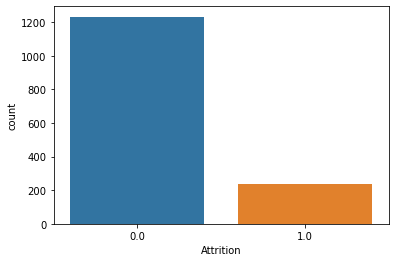

0.0    1233
1.0     237
Name: Attrition, dtype: int64

In [224]:
sns.countplot(x='Attrition', data =nomial_data)
plt.show()
nomial_data["Attrition"].value_counts()

#### Attrition value is lower

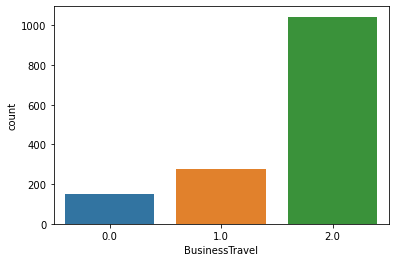

2.0    1043
1.0     277
0.0     150
Name: BusinessTravel, dtype: int64

In [225]:
sns.countplot(x='BusinessTravel', data =nomial_data)
plt.show()
nomial_data["BusinessTravel"].value_counts()

#### Employees who travel rarely is higher than the employees who travel frequently on business purpose and employees who do not travel at all is lower than both the employees who travel rarely and the employees who travel frequently.

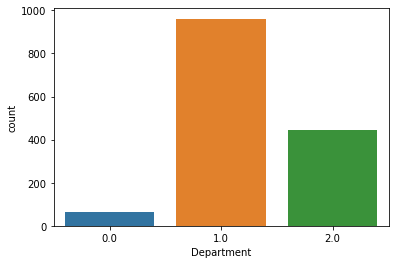

1.0    961
2.0    446
0.0     63
Name: Department, dtype: int64

In [226]:
sns.countplot(x='Department', data =nomial_data)
plt.show()
nomial_data["Department"].value_counts()

#### Research and Development department has the highest value of 961 and Sales has lower than Research and Development department which is 446 and Human Resources has the lowest with 63

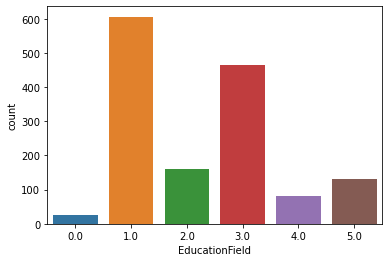

1.0    606
3.0    464
2.0    159
5.0    132
4.0     82
0.0     27
Name: EducationField, dtype: int64

In [227]:
sns.countplot(x='EducationField', data =nomial_data)
plt.show()
nomial_data["EducationField"].value_counts()

#### Life Sciences has the highest value with 606, Medical field has 464, Marketing field has 159,Technical Degree field has 132, Other fields has 82,Human Resources field has 27 


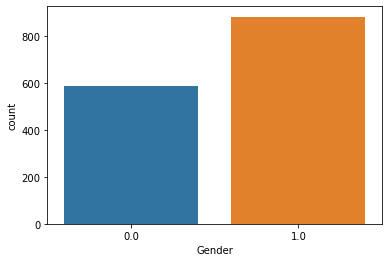

1.0    882
0.0    588
Name: Gender, dtype: int64

In [228]:
sns.countplot(x='Gender', data =nomial_data)
plt.show()
nomial_data["Gender"].value_counts()

#### Male employees are 882 and Female employees are 588

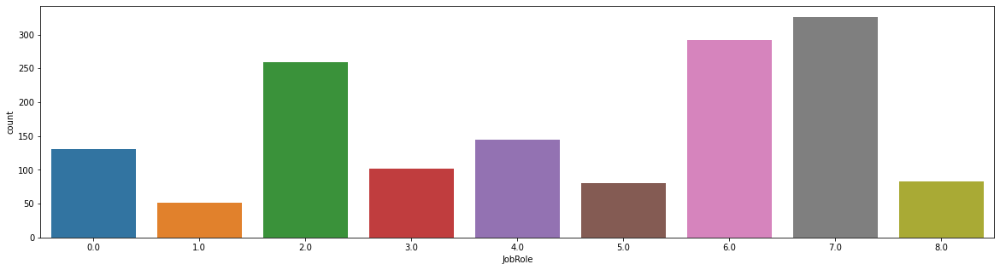

7.0    326
6.0    292
2.0    259
4.0    145
0.0    131
3.0    102
8.0     83
5.0     80
1.0     52
Name: JobRole, dtype: int64

In [229]:
plt.figure(figsize = (20,5))
sns.countplot(x='JobRole', data =nomial_data)
plt.show()
nomial_data["JobRole"].value_counts()

#### Sales Executive are 326, Research Scientist are 292, Laboratory Technician are 259, Manufacturing Director are 145, Healthcare Representative are 131, Manager are 102, Sales Representative are 83,Research Director are 80,Human Resources are 52

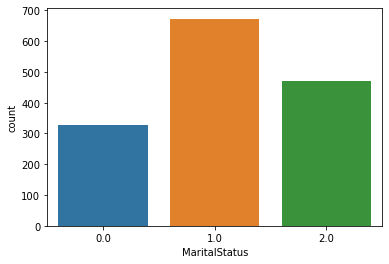

1.0    673
2.0    470
0.0    327
Name: MaritalStatus, dtype: int64

In [230]:
sns.countplot(x='MaritalStatus', data =nomial_data)
plt.show()
nomial_data["MaritalStatus"].value_counts()

#### There are 673 married eployees, 470 single employees, 327 divorced employees.

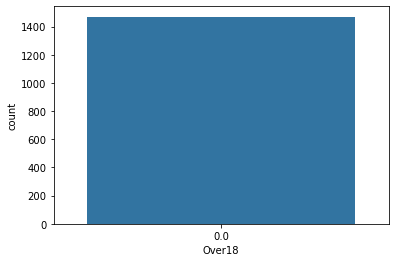

0.0    1470
Name: Over18, dtype: int64

In [231]:
sns.countplot(x='Over18', data =nomial_data)
plt.show()
nomial_data["Over18"].value_counts()

#### All the employees in the company are over 18.

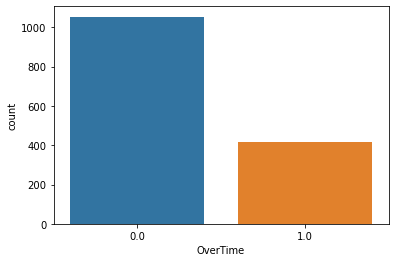

0.0    1054
1.0     416
Name: OverTime, dtype: int64

In [232]:
sns.countplot(x='OverTime', data =nomial_data)
plt.show()
nomial_data["OverTime"].value_counts()

#### 416 employees work over time and 1054 employees do not work over time.

## Plotting graph to check the distribution of each data

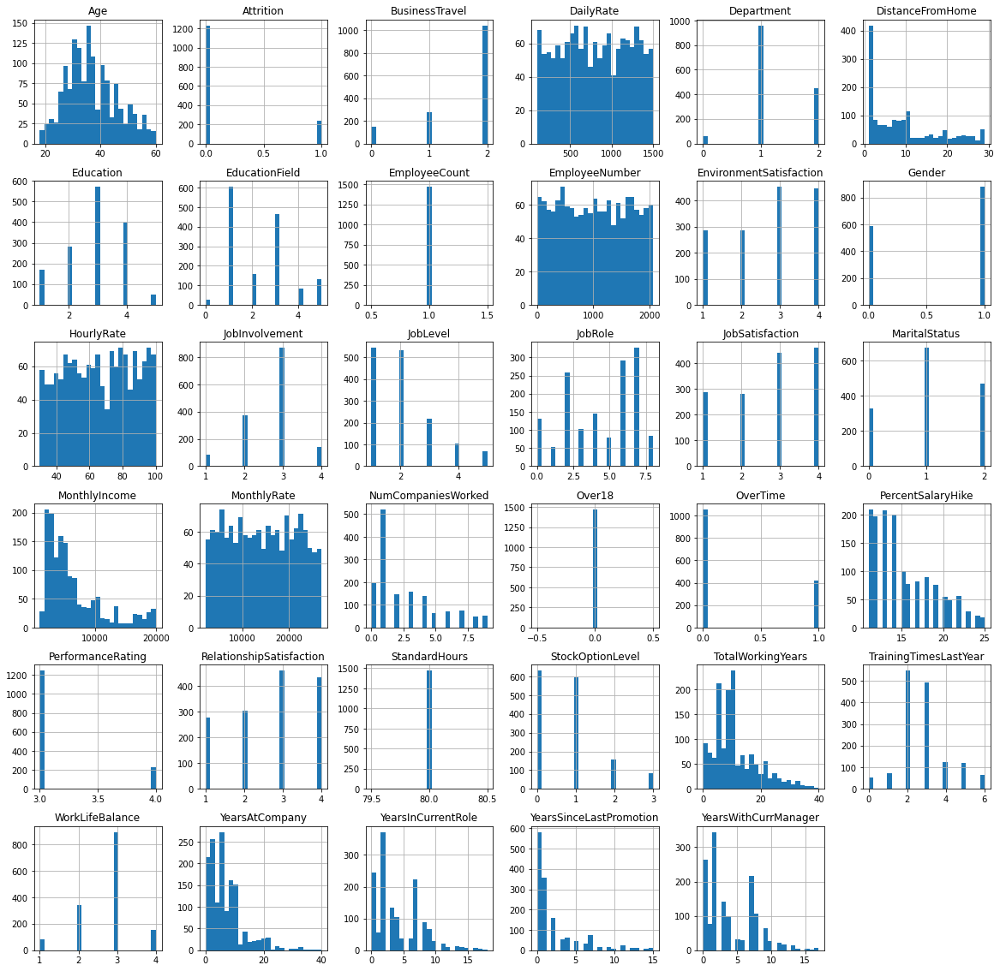

In [233]:
data.hist(bins=25,figsize=(20,20))
plt.show()

# Checking  for skewness and distribution of data

<AxesSubplot:xlabel='Age', ylabel='Density'>

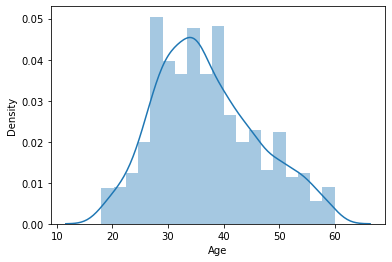

In [234]:
sns.distplot (data["Age"])

<AxesSubplot:xlabel='DailyRate', ylabel='Density'>

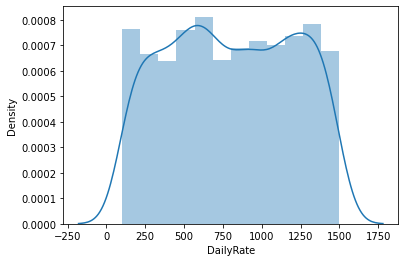

In [235]:
sns.distplot (data["DailyRate"])

<AxesSubplot:xlabel='DistanceFromHome', ylabel='Density'>

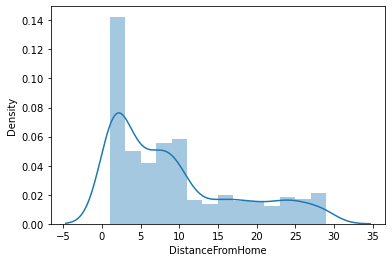

In [236]:
sns.distplot (data["DistanceFromHome"])

<AxesSubplot:xlabel='Education', ylabel='Density'>

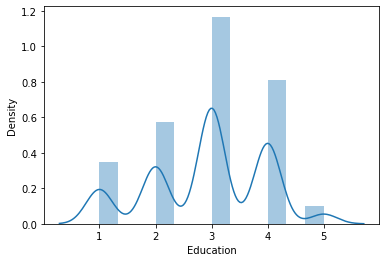

In [237]:
sns.distplot (data["Education"])

<AxesSubplot:xlabel='EmployeeCount', ylabel='Density'>

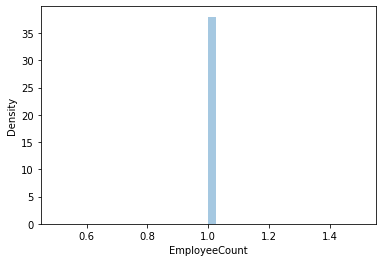

In [238]:
sns.distplot (data["EmployeeCount"])

<AxesSubplot:xlabel='EmployeeNumber', ylabel='Density'>

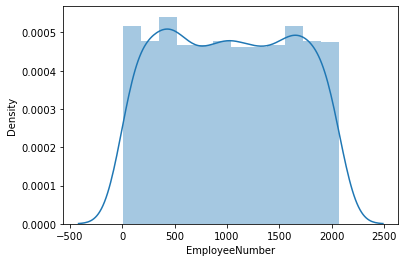

In [239]:
sns.distplot (data["EmployeeNumber"])

<AxesSubplot:xlabel='EnvironmentSatisfaction', ylabel='Density'>

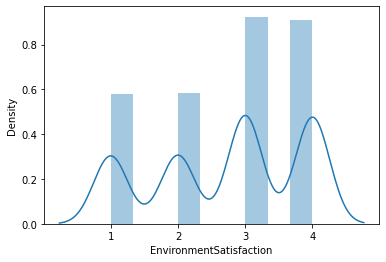

In [240]:
sns.distplot (data["EnvironmentSatisfaction"])

<AxesSubplot:xlabel='HourlyRate', ylabel='Density'>

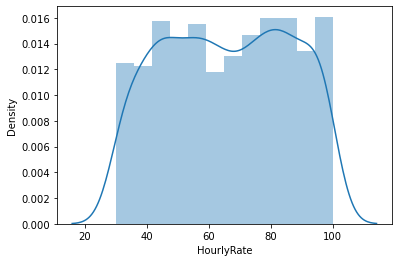

In [241]:
sns.distplot (data["HourlyRate"])

<AxesSubplot:xlabel='JobInvolvement', ylabel='Density'>

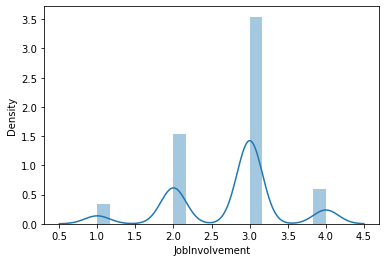

In [242]:
sns.distplot (data["JobInvolvement"])

<AxesSubplot:xlabel='JobLevel', ylabel='Density'>

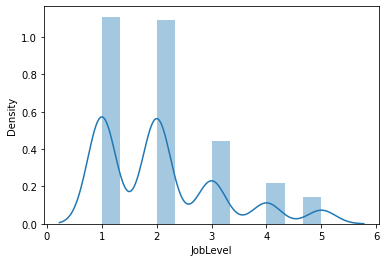

In [243]:
sns.distplot (data["JobLevel"])

<AxesSubplot:xlabel='JobSatisfaction', ylabel='Density'>

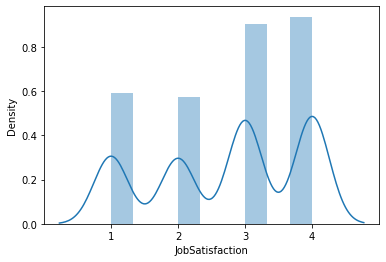

In [244]:
sns.distplot (data["JobSatisfaction"])

<AxesSubplot:xlabel='MonthlyIncome', ylabel='Density'>

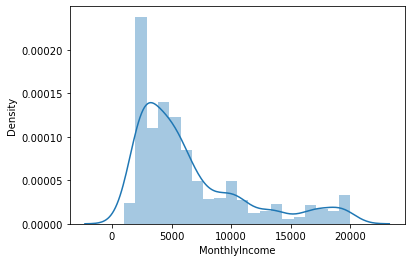

In [245]:
sns.distplot (data["MonthlyIncome"])

<AxesSubplot:xlabel='MonthlyRate', ylabel='Density'>

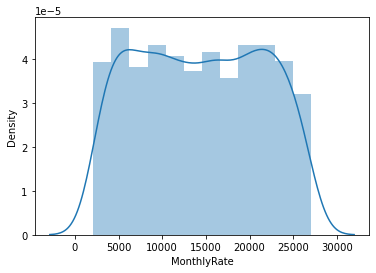

In [246]:
sns.distplot (data["MonthlyRate"])

<AxesSubplot:xlabel='NumCompaniesWorked', ylabel='Density'>

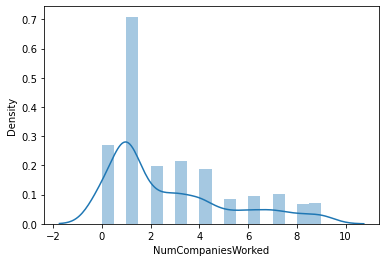

In [247]:
sns.distplot (data["NumCompaniesWorked"])

<AxesSubplot:xlabel='PercentSalaryHike', ylabel='Density'>

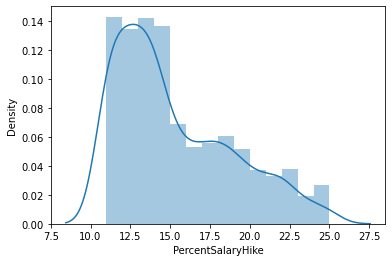

In [248]:
sns.distplot (data["PercentSalaryHike"])

<AxesSubplot:xlabel='PerformanceRating', ylabel='Density'>

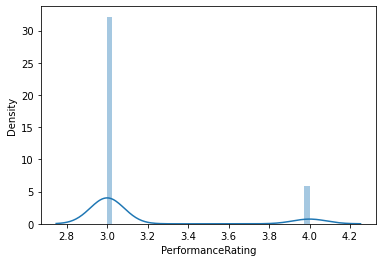

In [249]:
sns.distplot (data["PerformanceRating"])

<AxesSubplot:xlabel='RelationshipSatisfaction', ylabel='Density'>

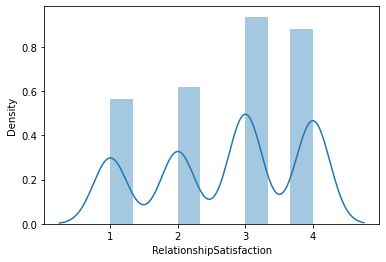

In [250]:
sns.distplot (data["RelationshipSatisfaction"])

<AxesSubplot:xlabel='StandardHours', ylabel='Density'>

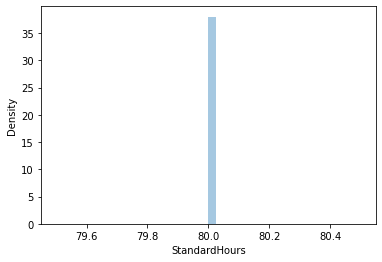

In [251]:
sns.distplot (data["StandardHours"])

<AxesSubplot:xlabel='StockOptionLevel', ylabel='Density'>

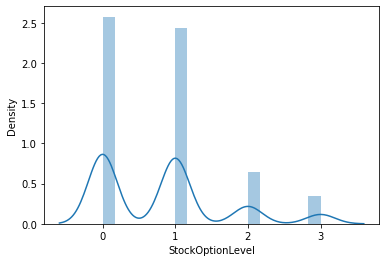

In [252]:
sns.distplot (data["StockOptionLevel"])

<AxesSubplot:xlabel='TotalWorkingYears', ylabel='Density'>

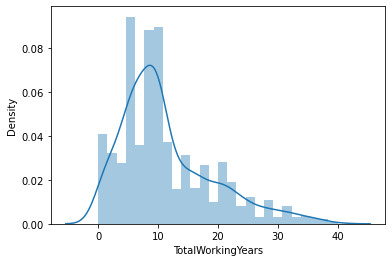

In [253]:
sns.distplot (data["TotalWorkingYears"])

<AxesSubplot:xlabel='TrainingTimesLastYear', ylabel='Density'>

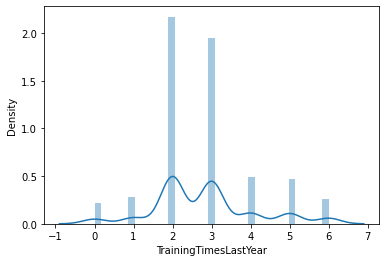

In [254]:
sns.distplot (data["TrainingTimesLastYear"])

<AxesSubplot:xlabel='WorkLifeBalance', ylabel='Density'>

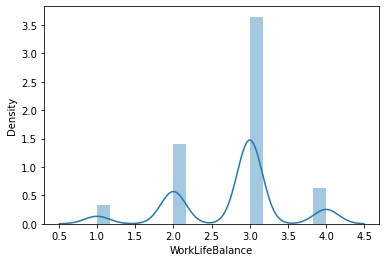

In [255]:
sns.distplot (data["WorkLifeBalance"])

<AxesSubplot:xlabel='YearsAtCompany', ylabel='Density'>

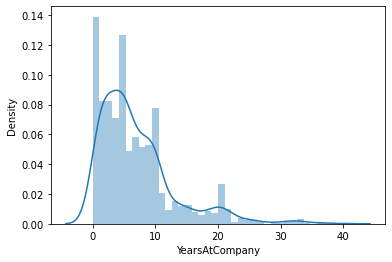

In [256]:
sns.distplot (data["YearsAtCompany"])

<AxesSubplot:xlabel='YearsInCurrentRole', ylabel='Density'>

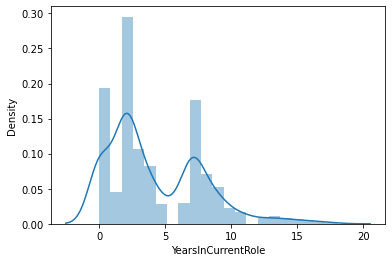

In [257]:
sns.distplot (data["YearsInCurrentRole"])

<AxesSubplot:xlabel='YearsSinceLastPromotion', ylabel='Density'>

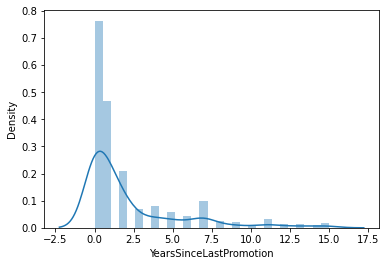

In [258]:
sns.distplot (data["YearsSinceLastPromotion"])

<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='Density'>

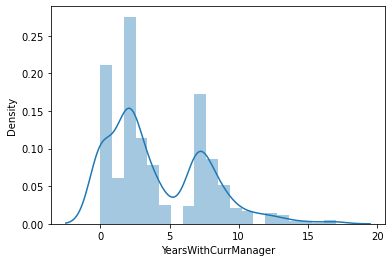

In [259]:
sns.distplot (data["YearsWithCurrManager"])

# Bivariant Analysis

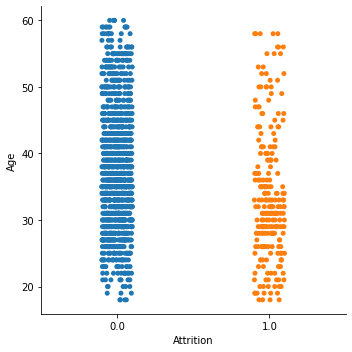

In [260]:
sns.catplot(x = "Attrition",y = "Age",data = data)

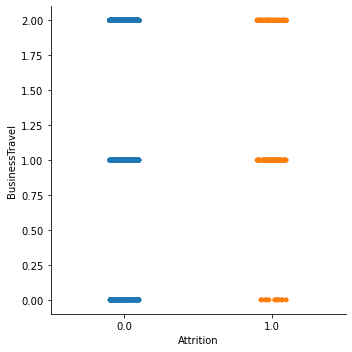

In [261]:
sns.catplot(x = "Attrition",y = "BusinessTravel",data = data)

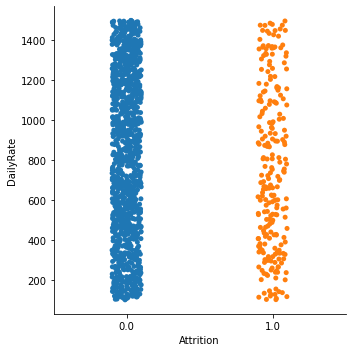

In [262]:
sns.catplot(x = "Attrition",y = "DailyRate",data = data)

# 1 is Yes 

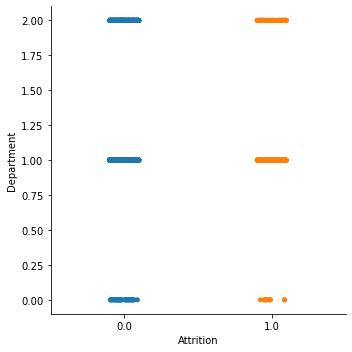

In [263]:
sns.catplot(x = "Attrition",y = "Department",data = data)

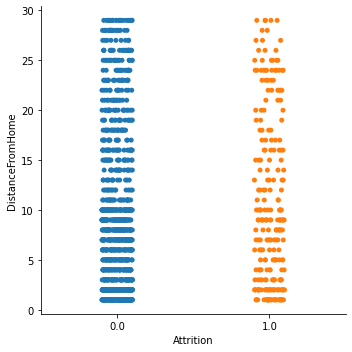

In [264]:
sns.catplot(x = "Attrition",y = "DistanceFromHome",data = data)

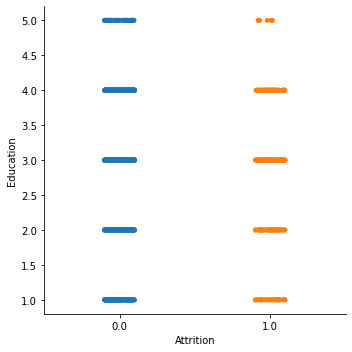

In [265]:
sns.catplot(x = "Attrition",y = "Education",data = data)

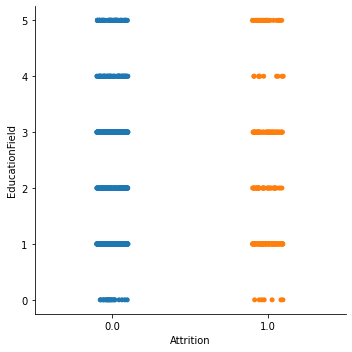

In [266]:
sns.catplot(x = "Attrition",y = "EducationField",data = data)

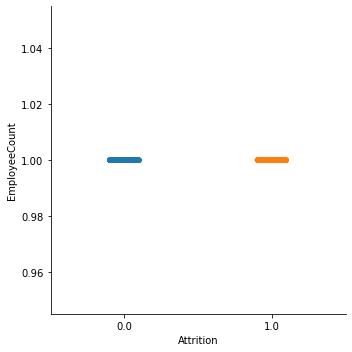

In [267]:
sns.catplot(x = "Attrition",y = "EmployeeCount",data = data)

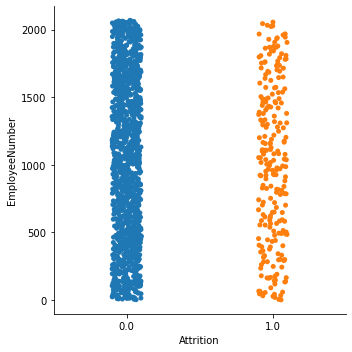

In [268]:
sns.catplot(x = "Attrition",y = "EmployeeNumber",data = data)

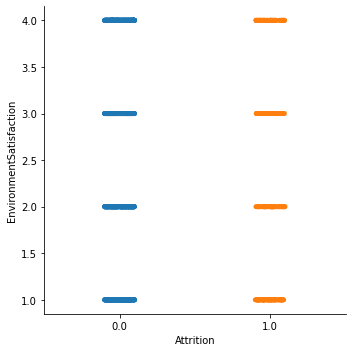

In [269]:
sns.catplot(x = "Attrition",y = "EnvironmentSatisfaction",data = data)

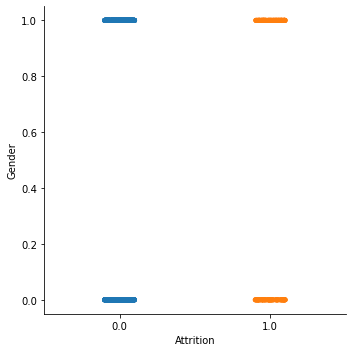

In [270]:
sns.catplot(x = "Attrition",y = "Gender",data = data)

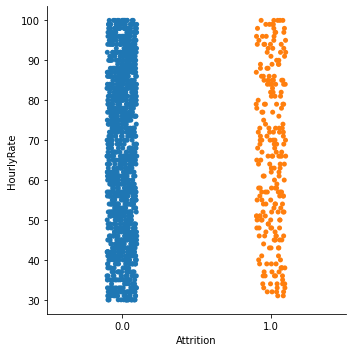

In [271]:
sns.catplot(x = "Attrition",y = "HourlyRate",data = data)

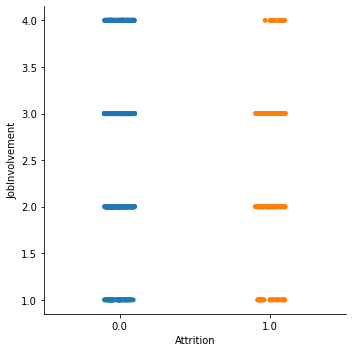

In [272]:
sns.catplot(x = "Attrition",y = "JobInvolvement",data = data)

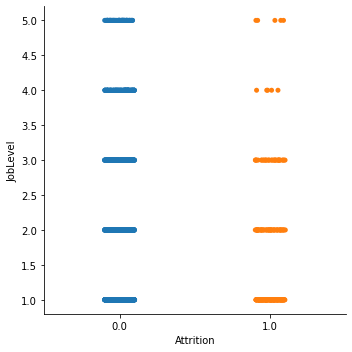

In [273]:
sns.catplot(x = "Attrition",y = "JobLevel",data = data)

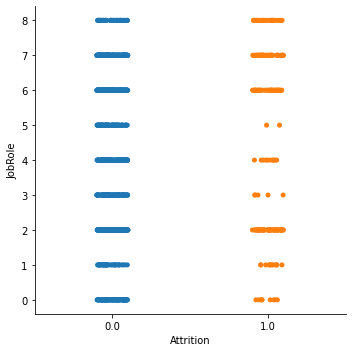

In [274]:
sns.catplot(x = "Attrition",y = "JobRole",data = data)

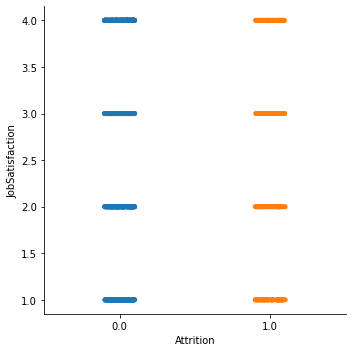

In [275]:
sns.catplot(x = "Attrition",y = "JobSatisfaction",data = data)

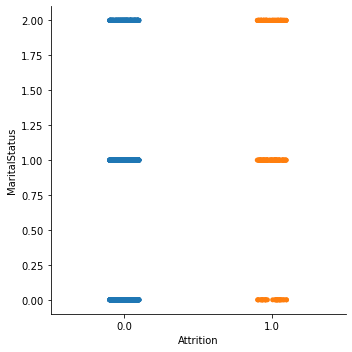

In [276]:
sns.catplot(x = "Attrition",y = "MaritalStatus",data = data)

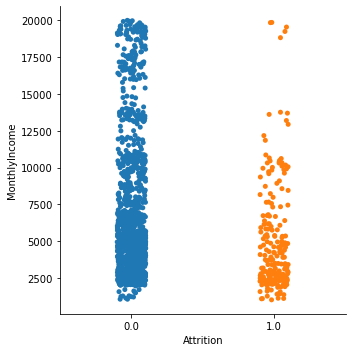

In [277]:
sns.catplot(x = "Attrition",y = "MonthlyIncome",data = data)

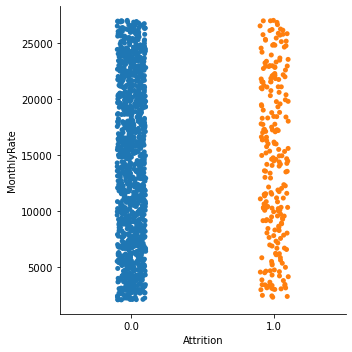

In [278]:
sns.catplot(x = "Attrition",y = "MonthlyRate",data = data)

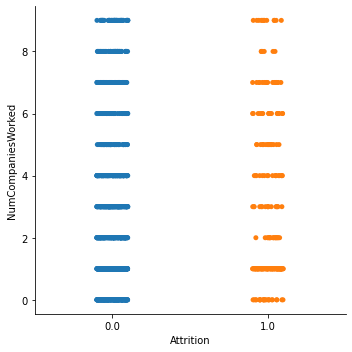

In [279]:
sns.catplot(x = "Attrition",y = "NumCompaniesWorked",data = data)

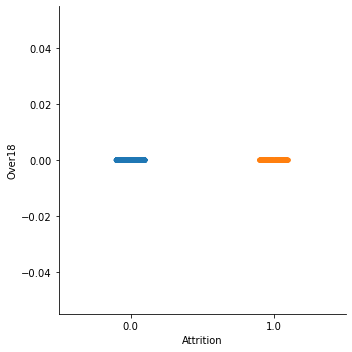

In [280]:
sns.catplot(x = "Attrition",y = "Over18",data = data)

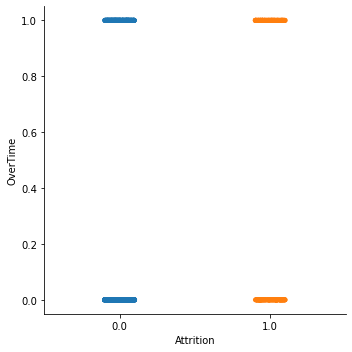

In [281]:
sns.catplot(x = "Attrition",y = "OverTime",data = data)

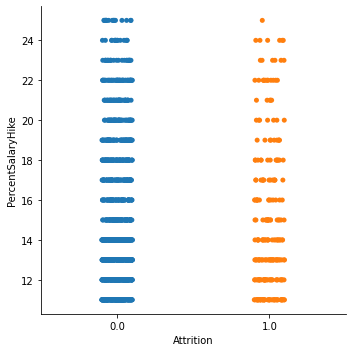

In [282]:
sns.catplot(x = "Attrition",y = "PercentSalaryHike",data = data)

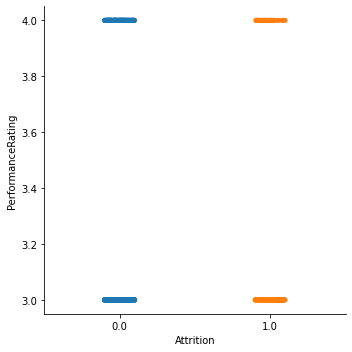

In [283]:
sns.catplot(x = "Attrition",y = "PerformanceRating",data = data)

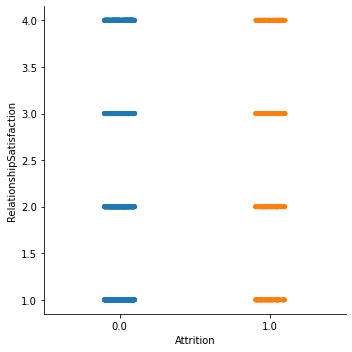

In [284]:
sns.catplot(x = "Attrition",y = "RelationshipSatisfaction",data = data)

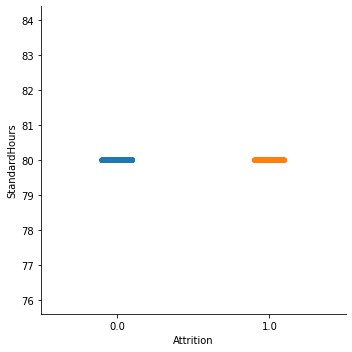

In [285]:
sns.catplot(x = "Attrition",y = "StandardHours",data = data)

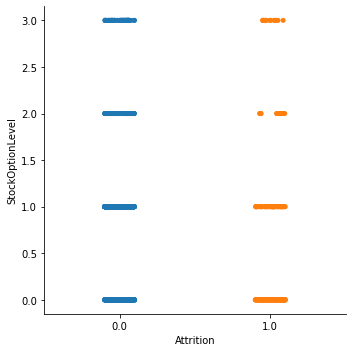

In [286]:
sns.catplot(x = "Attrition",y = "StockOptionLevel",data = data)

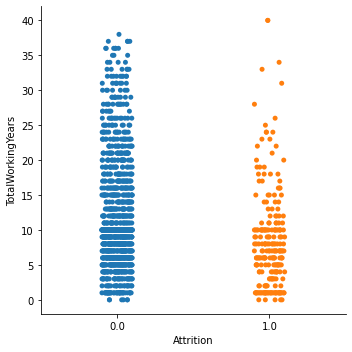

In [287]:
sns.catplot(x = "Attrition",y = "TotalWorkingYears",data = data)

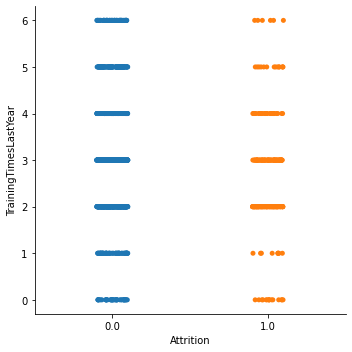

In [288]:
sns.catplot(x = "Attrition",y = "TrainingTimesLastYear",data = data)

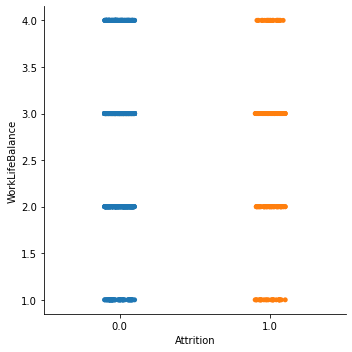

In [289]:
sns.catplot(x = "Attrition",y = "WorkLifeBalance",data = data)

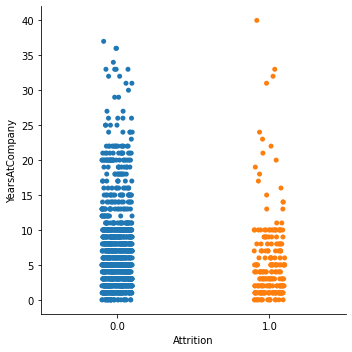

In [290]:
sns.catplot(x = "Attrition",y = "YearsAtCompany",data = data)

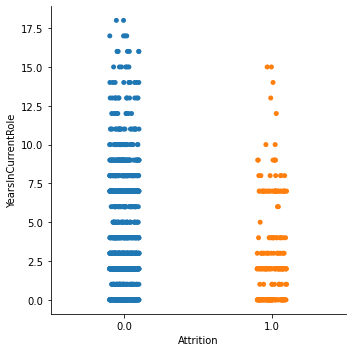

In [291]:
sns.catplot(x = "Attrition",y = "YearsInCurrentRole",data = data)

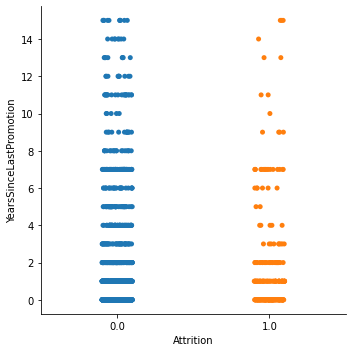

In [292]:
sns.catplot(x = "Attrition",y = "YearsSinceLastPromotion",data = data)

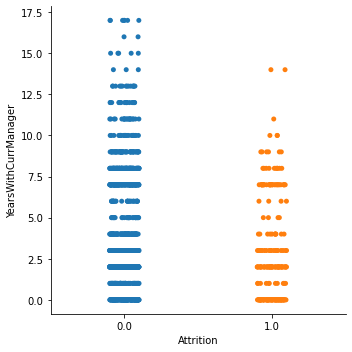

In [293]:
sns.catplot(x = "Attrition",y = "YearsWithCurrManager",data = data)

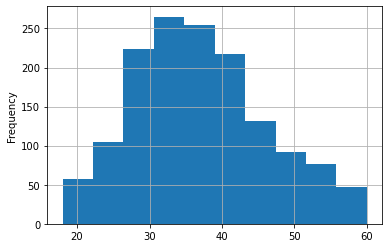

In [294]:
data["Age"].plot(kind='hist' , grid = True)
plt.show()

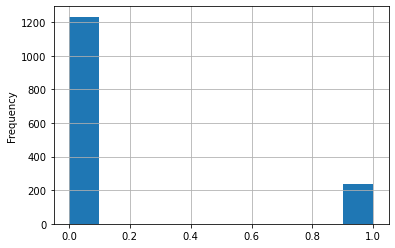

In [295]:
data["Attrition"].plot(kind='hist' , grid = True)
plt.show()

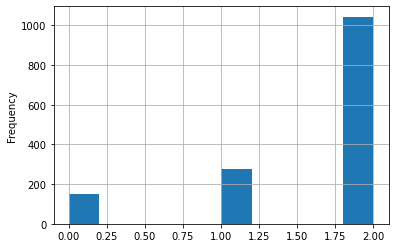

In [296]:
data["BusinessTravel"].plot(kind='hist' , grid = True)
plt.show()

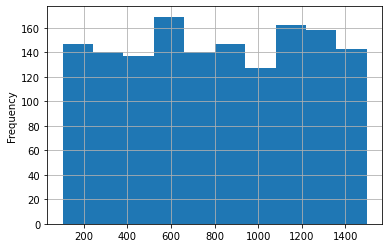

In [297]:
data["DailyRate"].plot(kind='hist' , grid = True)
plt.show()

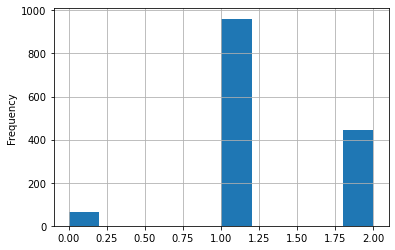

In [298]:
data["Department"].plot(kind='hist' , grid = True)
plt.show()

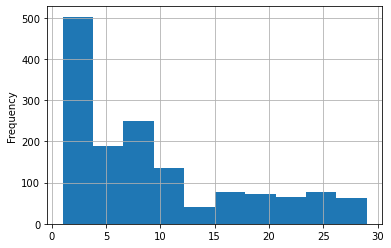

In [299]:
data["DistanceFromHome"].plot(kind='hist' , grid = True)
plt.show()

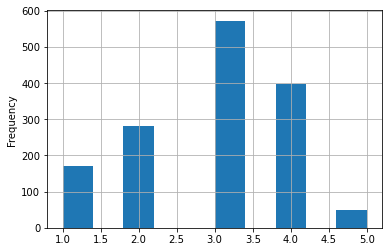

In [300]:
data["Education"].plot(kind='hist' , grid = True)
plt.show()

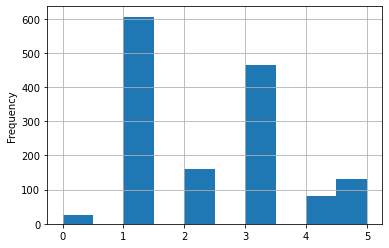

In [301]:
data["EducationField"].plot(kind='hist' , grid = True)
plt.show()

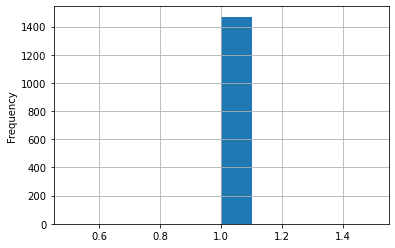

In [302]:
data["EmployeeCount"].plot(kind='hist' , grid = True)
plt.show()

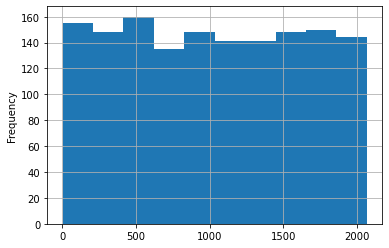

In [303]:
data["EmployeeNumber"].plot(kind='hist' , grid = True)
plt.show()

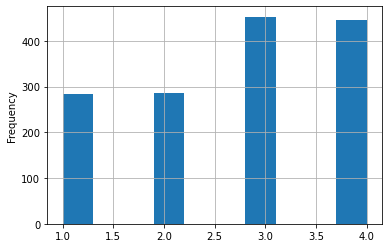

In [304]:
data["EnvironmentSatisfaction"].plot(kind='hist' , grid = True)
plt.show()

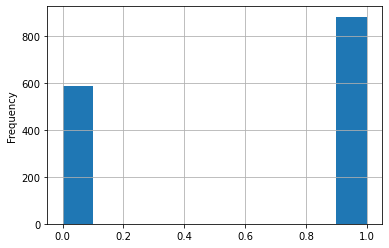

In [305]:
data["Gender"].plot(kind='hist' , grid = True)
plt.show()

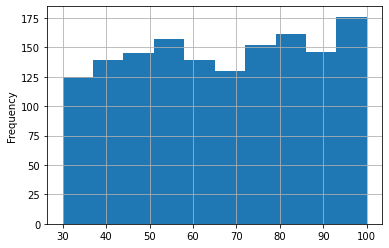

In [306]:
data["HourlyRate"].plot(kind='hist' , grid = True)
plt.show()

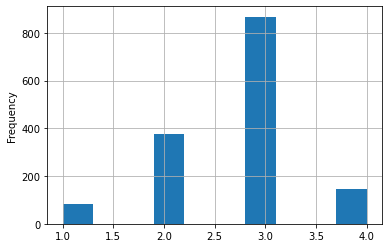

In [307]:
data["JobInvolvement"].plot(kind='hist' , grid = True)
plt.show()

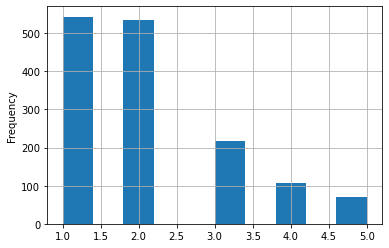

In [308]:
data["JobLevel"].plot(kind='hist' , grid = True)
plt.show()

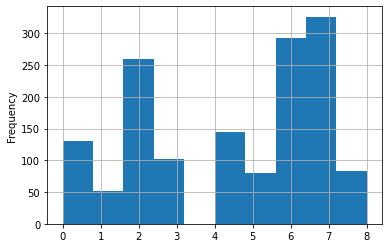

In [309]:
data["JobRole"].plot(kind='hist' , grid = True)
plt.show()

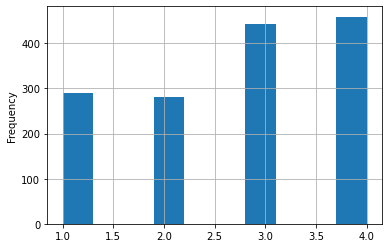

In [310]:
data["JobSatisfaction"].plot(kind='hist' , grid = True)
plt.show()

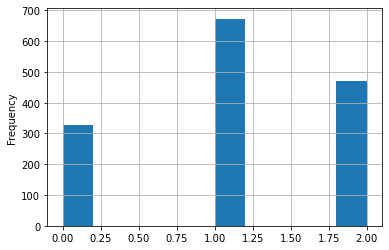

In [311]:
data["MaritalStatus"].plot(kind='hist' , grid = True)
plt.show()

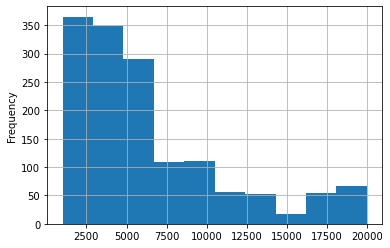

In [312]:
data["MonthlyIncome"].plot(kind='hist' , grid = True)
plt.show()

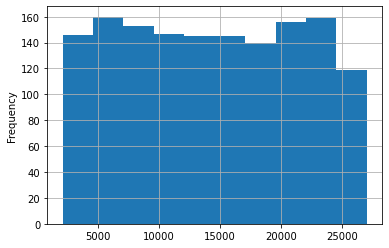

In [313]:
data["MonthlyRate"].plot(kind='hist' , grid = True)
plt.show()

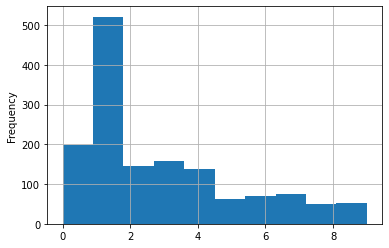

In [314]:
data["NumCompaniesWorked"].plot(kind='hist' , grid = True)
plt.show()

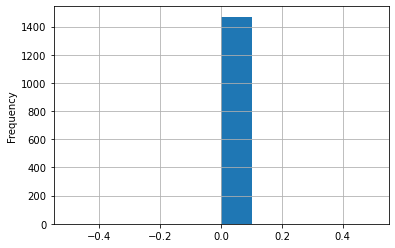

In [315]:
data["Over18"].plot(kind='hist' , grid = True)
plt.show()

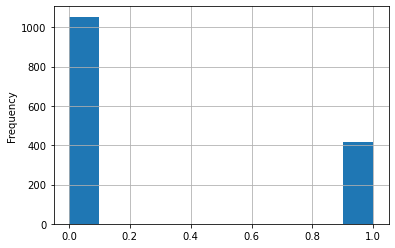

In [316]:
data["OverTime"].plot(kind='hist' , grid = True)
plt.show()

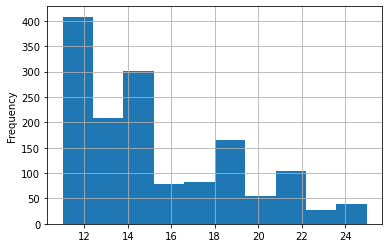

In [317]:
data["PercentSalaryHike"].plot(kind='hist' , grid = True)
plt.show()

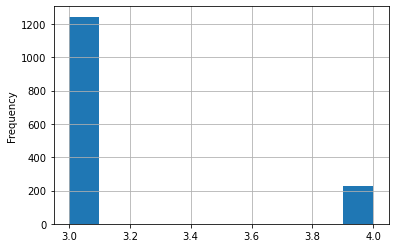

In [318]:
data["PerformanceRating"].plot(kind='hist' , grid = True)
plt.show()

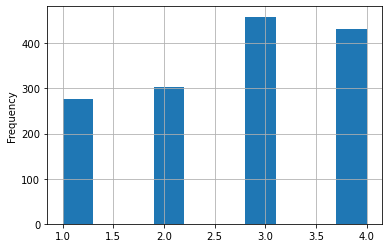

In [319]:
data["RelationshipSatisfaction"].plot(kind='hist' , grid = True)
plt.show()

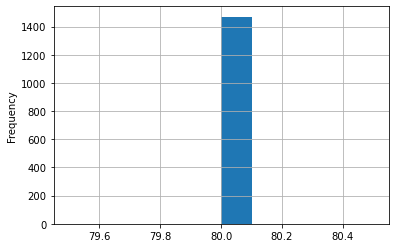

In [320]:
data["StandardHours"].plot(kind='hist' , grid = True)
plt.show()

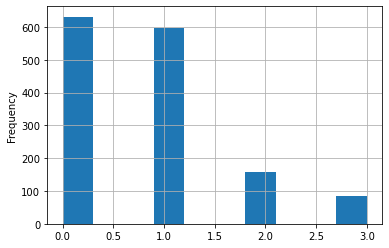

In [321]:
data["StockOptionLevel"].plot(kind='hist' , grid = True)
plt.show()

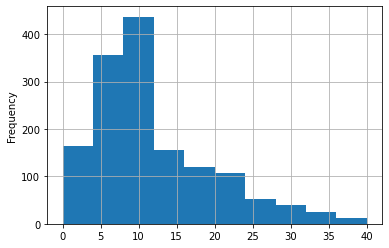

In [322]:
data["TotalWorkingYears"].plot(kind='hist' , grid = True)
plt.show()

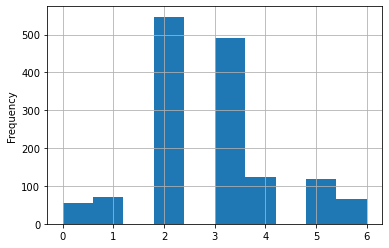

In [323]:
data["TrainingTimesLastYear"].plot(kind='hist' , grid = True)
plt.show()

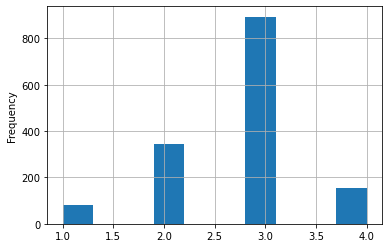

In [324]:
data["WorkLifeBalance"].plot(kind='hist' , grid = True)
plt.show()

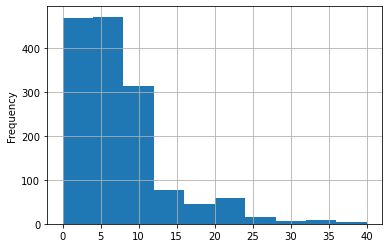

In [325]:
data["YearsAtCompany"].plot(kind='hist' , grid = True)
plt.show()

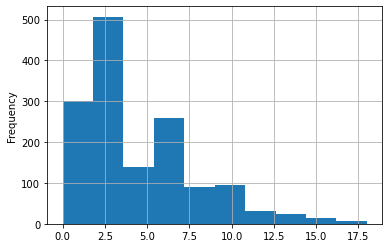

In [326]:
data["YearsInCurrentRole"].plot(kind='hist' , grid = True)
plt.show()

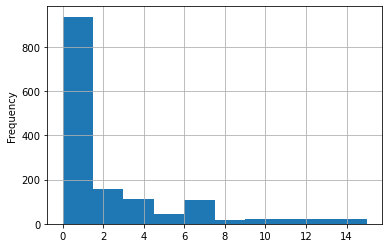

In [327]:
data["YearsSinceLastPromotion"].plot(kind='hist' , grid = True)
plt.show()

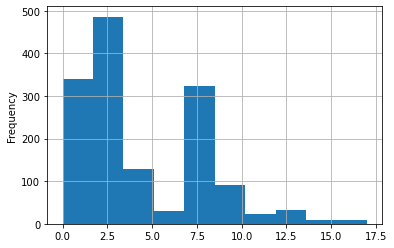

In [328]:
data["YearsWithCurrManager"].plot(kind='hist' , grid = True)
plt.show()

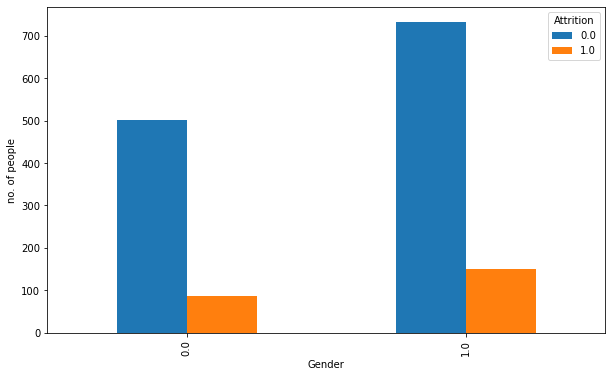

In [330]:
pd.crosstab(data['Gender'],data['Attrition']).plot(kind="bar",figsize=(10,6))
plt.ylabel("no. of people")
plt.show()

## Number of peope  who left based on gender 
## more numer of males have left than female 

In [397]:
data

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1.0,2.0,1102,2.0,1,2,1.0,1,1,2,0.0,94,3,2,7.0,4,2.0,5993,19479,8,0.0,1.0,11,3,1,80,0,8,0,1,6,4,0,5
1,49,0.0,1.0,279,1.0,8,1,1.0,1,2,3,1.0,61,2,2,6.0,2,1.0,5130,24907,1,0.0,0.0,23,4,4,80,1,10,3,3,10,7,1,7
2,37,1.0,2.0,1373,1.0,2,2,4.0,1,4,4,1.0,92,2,1,2.0,3,2.0,2090,2396,6,0.0,1.0,15,3,2,80,0,7,3,3,0,0,0,0
3,33,0.0,1.0,1392,1.0,3,4,1.0,1,5,4,0.0,56,3,1,6.0,3,1.0,2909,23159,1,0.0,1.0,11,3,3,80,0,8,3,3,8,7,3,0
4,27,0.0,2.0,591,1.0,2,1,3.0,1,7,1,1.0,40,3,1,2.0,2,1.0,3468,16632,9,0.0,0.0,12,3,4,80,1,6,3,3,2,2,2,2
5,32,0.0,1.0,1005,1.0,2,2,1.0,1,8,4,1.0,79,3,1,2.0,4,2.0,3068,11864,0,0.0,0.0,13,3,3,80,0,8,2,2,7,7,3,6
6,59,0.0,2.0,1324,1.0,3,3,3.0,1,10,3,0.0,81,4,1,2.0,1,1.0,2670,9964,4,0.0,1.0,20,4,1,80,3,12,3,2,1,0,0,0
7,30,0.0,2.0,1358,1.0,24,1,1.0,1,11,4,1.0,67,3,1,2.0,3,0.0,2693,13335,1,0.0,0.0,22,4,2,80,1,1,2,3,1,0,0,0
8,38,0.0,1.0,216,1.0,23,3,1.0,1,12,4,1.0,44,2,3,4.0,3,2.0,9526,8787,0,0.0,0.0,21,4,2,80,0,10,2,3,9,7,1,8
9,36,0.0,2.0,1299,1.0,27,3,3.0,1,13,3,1.0,94,3,2,0.0,3,1.0,5237,16577,6,0.0,0.0,13,3,2,80,2,17,3,2,7,7,7,7


# checking correlation

In [483]:
cor = data.corr()

In [484]:
cor

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.024751,0.010661,-0.031882,-0.001686,0.208034,-0.040873,NaN,-0.010145,0.010146,-0.036311,0.024287,0.029820,0.509604,-0.122427,-0.004892,-0.095029,0.497855,0.028051,0.299635,NaN,0.028062,0.003634,0.001904,0.053535,NaN,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,0.000074,-0.056652,0.063991,0.077924,-0.031373,0.026846,NaN,-0.010577,-0.103369,0.029453,-0.006846,-0.130016,-0.169105,0.067151,-0.103481,0.162070,-0.159840,0.015170,0.043494,NaN,0.246118,-0.013478,0.002889,-0.045872,NaN,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
BusinessTravel,0.024751,0.000074,1.000000,-0.004086,-0.009044,-0.024469,0.000757,0.023724,NaN,-0.015578,0.004174,-0.032981,0.026528,0.039062,0.019311,0.002724,-0.033962,0.024001,0.034319,-0.014107,0.020875,NaN,0.016543,-0.029377,-0.026341,-0.035986,NaN,-0.016727,0.034226,0.015240,-0.011256,-0.014575,-0.011497,-0.032591,-0.022636
DailyRate,0.010661,-0.056652,-0.004086,1.000000,0.007109,-0.004985,-0.016806,0.037709,NaN,-0.050990,0.018355,-0.011716,0.023381,0.046135,0.002966,-0.009472,0.030571,-0.069586,0.007707,-0.032182,0.038153,NaN,0.009135,0.022704,0.000473,0.007846,NaN,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
Department,-0.031882,0.063991,-0.009044,0.007109,1.000000,0.017225,0.007996,0.013720,NaN,-0.010895,-0.019395,-0.041583,-0.004144,-0.024586,0.101963,0.662431,0.021001,0.056073,0.053130,0.023642,-0.035882,NaN,0.007481,-0.007840,-0.024604,-0.022414,NaN,-0.012193,-0.015762,0.036875,0.026383,0.022920,0.056315,0.040061,0.034282
DistanceFromHome,-0.001686,0.077924,-0.024469,-0.004985,0.017225,1.000000,0.021042,0.002013,NaN,0.032916,-0.016075,-0.001851,0.031131,0.008783,0.005303,-0.001015,-0.003669,-0.014437,-0.017014,0.027473,-0.029251,NaN,0.025514,0.040235,0.027110,0.006557,NaN,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,0.000757,-0.016806,0.007996,0.021042,1.000000,-0.039592,NaN,0.042070,-0.027128,-0.016547,0.016775,0.042438,0.101589,0.004236,-0.011296,0.004053,0.094961,-0.026084,0.126317,NaN,-0.020322,-0.011111,-0.024539,-0.009118,NaN,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EducationField,-0.040873,0.026846,0.023724,0.037709,0.013720,0.002013,-0.039592,1.000000,NaN,-0.002516,0.043163,-0.002504,-0.021941,-0.002655,-0.044933,0.015599,-0.034401,0.014420,-0.041070,-0.027182,-0.008663,NaN,0.002259,-0.011214,-0.005614,-0.004378,NaN,-0.016185,-0.027848,0.049195,0.041191,-0.018692,-0.010506,0.002326,-0.004130
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,-0.010145,-0.010577,-0.015578,-0.050990,-0.010895,0.032916,0.042070,-0.002516,NaN,1.000000,0.017621,0.022556,0.035179,-0.006888,-0.018519,-0.010336,-0.046247,-0.008155,-0.014829,0.012648,-0.001251,NaN,-0.024037,-0.012944,-0.020359,-0.069861,NaN,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197


In [485]:
# dropping  columns with Nan values 
data_1 = data.drop(["EmployeeCount","Over18","StandardHours"], axis = 1)

In [493]:
cor = data_1.corr()

<AxesSubplot:>

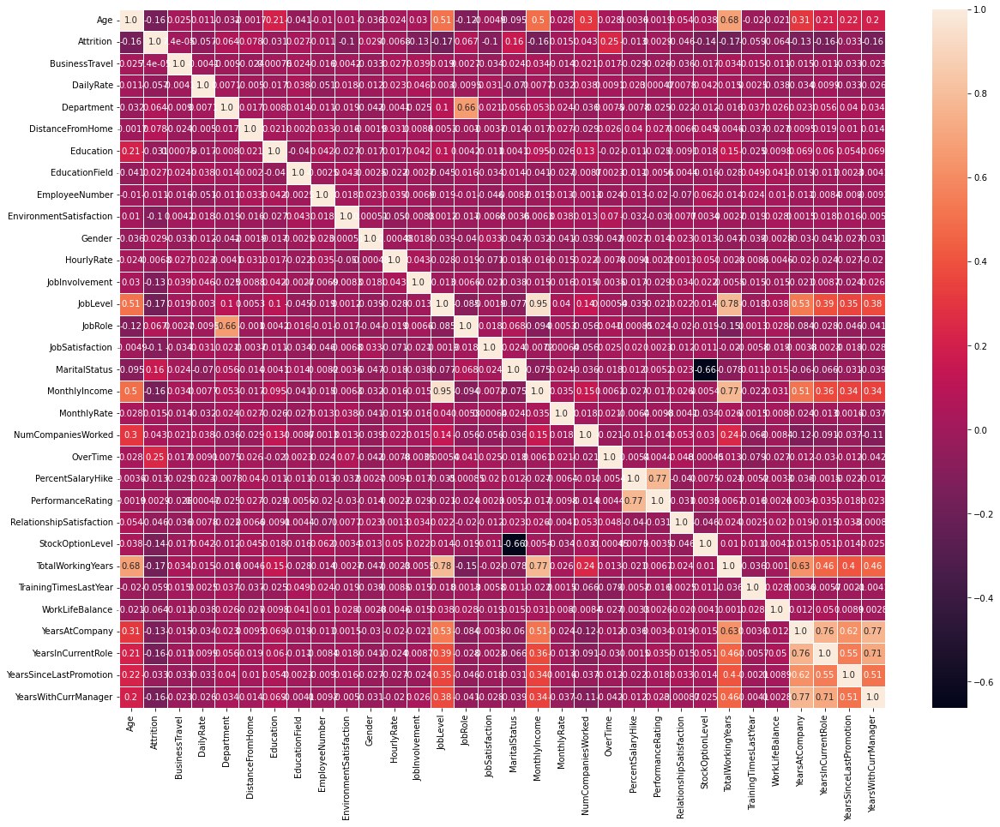

In [487]:
plt.figure(figsize =  (20,15))
sns.heatmap(cor,annot = True,linewidth = 0.5 ,linecolor = "white", fmt ='0.2')

In [488]:
for a in range(len(data.corr().columns)):
    for b in range(a):
        if (data.corr().iloc[a,b]) >0.7:
            name = data.corr().columns[a]
            print(name)

MonthlyIncome
PerformanceRating
TotalWorkingYears
TotalWorkingYears
YearsInCurrentRole
YearsWithCurrManager
YearsWithCurrManager


In [489]:

data_1.drop(["PerformanceRating","YearsWithCurrManager","YearsInCurrentRole"], axis = 1  , inplace = True )



In [490]:
data_1.drop(["MonthlyIncome"], axis = 1  , inplace = True )


In [491]:
data_1.drop(["JobLevel"], axis = 1  , inplace = True )


<AxesSubplot:>

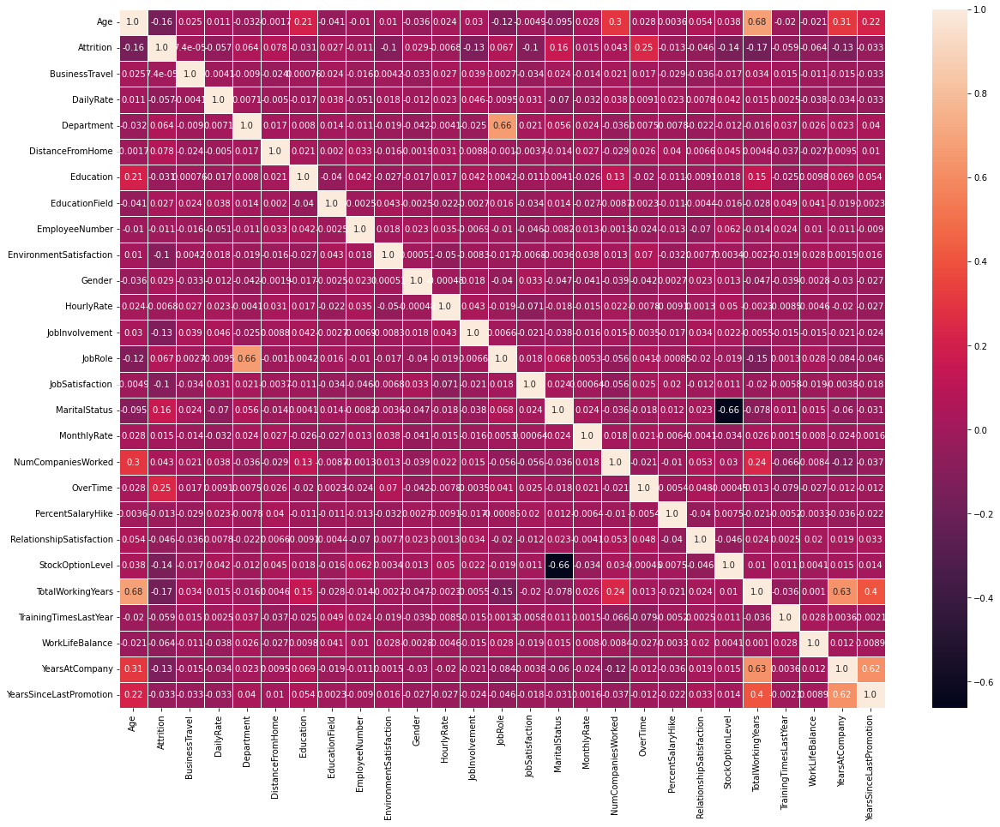

In [494]:
plt.figure(figsize =  (20,15))
sns.heatmap(cor,annot = True,linewidth = 0.5 ,linecolor = "white", fmt ='0.2')

### dropping columns with more than 0.7 correlation  from above data 

# checking skewness of  data

In [495]:

data_1.skew()

Age                         0.413286
Attrition                   1.844366
BusinessTravel             -1.439006
DailyRate                  -0.003519
Department                  0.172231
DistanceFromHome            0.958118
Education                  -0.289681
EducationField              0.550371
EmployeeNumber              0.016574
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
OverTime                    0.964489
PercentSalaryHike           0.821128
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany              1.764529
YearsSinceLastPromotion     1.984290
d

In [439]:
data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   Attrition                 1470 non-null   float64
 2   BusinessTravel            1470 non-null   float64
 3   DailyRate                 1470 non-null   int64  
 4   Department                1470 non-null   float64
 5   DistanceFromHome          1470 non-null   int64  
 6   Education                 1470 non-null   int64  
 7   EducationField            1470 non-null   float64
 8   EmployeeNumber            1470 non-null   int64  
 9   EnvironmentSatisfaction   1470 non-null   int64  
 10  Gender                    1470 non-null   float64
 11  HourlyRate                1470 non-null   int64  
 12  JobInvolvement            1470 non-null   int64  
 13  JobLevel                  1470 non-null   int64  
 14  JobRole 

In [496]:
from sklearn.preprocessing import  power_transform
data_1["TotalWorkingYears"] =  power_transform(data_1["TotalWorkingYears"].array.reshape(-1, 1),method = 'yeo-johnson')

In [497]:
from sklearn.preprocessing import  power_transform
data_1["YearsSinceLastPromotion"] =  power_transform(data_1["YearsSinceLastPromotion"].array.reshape(-1, 1),method = 'yeo-johnson')

In [498]:
from sklearn.preprocessing import  power_transform
data_1["YearsAtCompany"] =  power_transform(data_1["YearsAtCompany"].array.reshape(-1, 1),method = 'yeo-johnson')

In [499]:
from sklearn.preprocessing import  power_transform
data_1["StockOptionLevel"] =  power_transform(data_1["StockOptionLevel"].array.reshape(-1, 1),method = 'yeo-johnson')

In [500]:
from sklearn.preprocessing import  power_transform
data_1["PercentSalaryHike"] =  power_transform(data_1["PercentSalaryHike"].array.reshape(-1, 1),method = 'yeo-johnson')

In [501]:
from sklearn.preprocessing import  power_transform
data_1["NumCompaniesWorked"] =  power_transform(data_1["NumCompaniesWorked"].array.reshape(-1, 1),method = 'yeo-johnson')

In [503]:
data_1.skew()

Age                         0.413286
Attrition                   1.844366
BusinessTravel             -1.439006
DailyRate                  -0.003519
Department                  0.172231
DistanceFromHome            0.958118
Education                  -0.289681
EducationField              0.550371
EmployeeNumber              0.016574
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyRate                 0.018578
NumCompaniesWorked          0.014814
OverTime                    0.964489
PercentSalaryHike           0.116250
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.087019
TotalWorkingYears          -0.010653
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany             -0.008683
YearsSinceLastPromotion     0.212129
d

### skewness is fixed for all data except categorical data 

# checking for outliers 

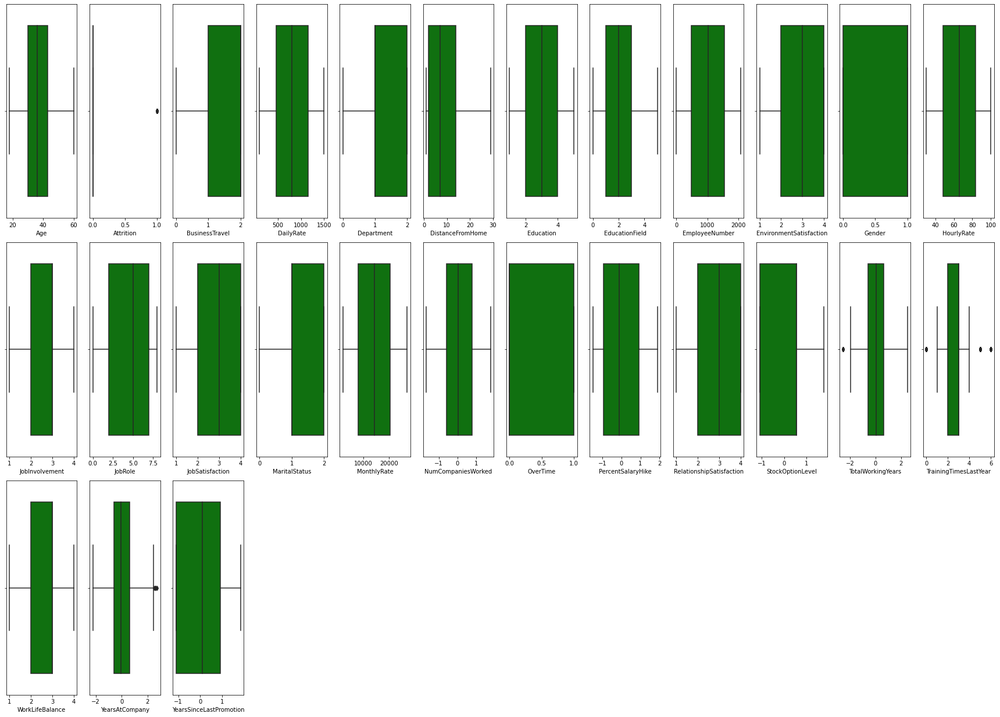

In [507]:
column = data_1.columns.values
ncol = 12
nrows = 158
plt.figure(figsize = (2*ncol,75*ncol))
for i in range ( 0 ,len(column)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(data_1[column[i]],color ="green",orient = "h")    
    plt.tight_layout()

In [509]:
from scipy.stats import zscore
import numpy as np
z = np.abs(zscore(data_1))
data_1.shape

(1470, 27)

In [510]:
threshold = 3
print(np.where(z>3))

(array([], dtype=int64), array([], dtype=int64))




###  as we can we can see there are no outliers 

# seperating x / input and y / output data

In [561]:
x = data_1.drop(["Attrition","Age"] , axis = 1) 

In [562]:
y = data_1["Attrition"]

In [563]:
x

,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobRole,JobSatisfaction,MaritalStatus,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsSinceLastPromotion
0,2.0,1102,2.0,1,2,1.0,1,2,0.0,94,3,7.0,4,2.0,19479,1.621331,1.0,-1.488918,1,-1.087933,-0.244305,0,1,0.139692,-1.094862
1,1.0,279,1.0,8,1,1.0,2,3,1.0,61,2,6.0,2,1.0,24907,-0.571302,0.0,1.679689,4,0.548969,0.052495,3,3,0.762660,0.096854
2,2.0,1373,1.0,2,2,4.0,4,4,1.0,92,2,2.0,3,2.0,2396,1.271339,1.0,0.201133,2,-1.087933,-0.410500,3,3,-2.229592,-1.094862
3,1.0,1392,1.0,3,4,1.0,5,4,0.0,56,3,6.0,3,1.0,23159,-0.571302,1.0,-1.488918,3,-1.087933,-0.244305,3,3,0.482432,0.905592
4,2.0,591,1.0,2,1,3.0,7,1,1.0,40,3,2.0,2,1.0,16632,1.766182,0.0,-0.948760,4,0.548969,-0.592063,3,3,-0.951540,0.607464
5,1.0,1005,1.0,2,2,1.0,8,4,1.0,79,3,2.0,4,2.0,11864,-1.664787,0.0,-0.499665,3,-1.087933,-0.244305,2,2,0.320677,0.905592
6,2.0,1324,1.0,3,3,3.0,10,3,0.0,81,4,2.0,1,1.0,9964,0.792695,1.0,1.281630,1,1.785018,0.313335,3,2,-1.440442,-1.094862
7,2.0,1358,1.0,24,1,1.0,11,4,1.0,67,3,2.0,3,0.0,13335,-0.571302,0.0,1.560773,2,0.548969,-1.988249,2,3,-1.440442,-1.094862
8,1.0,216,1.0,23,3,1.0,12,4,1.0,44,2,4.0,3,2.0,8787,-1.664787,0.0,1.428797,2,-1.087933,0.052495,2,3,0.628829,0.096854
9,2.0,1299,1.0,27,3,3.0,13,3,1.0,94,3,0.0,3,1.0,16577,1.271339,0.0,-0.499665,2,1.313755,0.859893,3,2,0.320677,1.454429


In [515]:
y

0       1.0
1       0.0
2       1.0
3       0.0
4       0.0
5       0.0
6       0.0
7       0.0
8       0.0
9       0.0
10      0.0
11      0.0
12      0.0
13      0.0
14      1.0
15      0.0
16      0.0
17      0.0
18      0.0
19      0.0
20      0.0
21      1.0
22      0.0
23      0.0
24      1.0
25      0.0
26      1.0
27      0.0
28      0.0
29      0.0
30      0.0
31      0.0
32      0.0
33      1.0
34      1.0
35      0.0
36      1.0
37      0.0
38      0.0
39      0.0
40      0.0
41      0.0
42      1.0
43      0.0
44      0.0
45      1.0
46      0.0
47      0.0
48      0.0
49      0.0
50      1.0
51      1.0
52      0.0
53      0.0
54      0.0
55      0.0
56      0.0
57      0.0
58      0.0
59      0.0
60      0.0
61      0.0
62      0.0
63      0.0
64      0.0
65      0.0
66      0.0
67      0.0
68      0.0
69      1.0
70      0.0
71      0.0
72      0.0
73      0.0
74      0.0
75      0.0
76      0.0
77      0.0
78      0.0
79      0.0
80      0.0
81      0.0
82      0.0
83  

In [564]:
from statsmodels.stats.outliers_influence  import variance_inflation_factor

In [565]:
def calc_vif(x):
    vif= pd.DataFrame()
    vif["variables"] = x.columns
    vif["VIF"] = [variance_inflation_factor(x.values,i) for i in range(x.shape[1])]

    return(vif)

In [566]:
calc_vif(x)

,variables,VIF
0,BusinessTravel,6.541714
1,DailyRate,4.867185
2,Department,12.008030
3,DistanceFromHome,2.291067
4,Education,8.834003
5,EducationField,3.819548
6,EmployeeNumber,3.884298
7,EnvironmentSatisfaction,6.916135
8,Gender,2.495713
9,HourlyRate,10.586821


 
 
 # scaling data

In [567]:

from sklearn.preprocessing import MinMaxScaler

mms = MinMaxScaler ()

In [568]:
x = mms.fit_transform(x) 

In [569]:
x

array([[1.        , 0.71581961, 1.        , ..., 0.        , 0.475475  ,
        0.        ],
       [0.5       , 0.12670007, 0.5       , ..., 0.66666667, 0.600494  ,
        0.40787739],
       [1.        , 0.90980673, 0.5       , ..., 0.66666667, 0.        ,
        0.        ],
       ...,
       [1.        , 0.03793844, 0.5       , ..., 0.66666667, 0.475475  ,
        0.        ],
       [0.5       , 0.65926986, 1.        , ..., 0.33333333, 0.57363637,
        0.        ],
       [1.        , 0.37652112, 0.5       , ..., 1.        , 0.38617662,
        0.40787739]])

# splitting data for tesing and training 

In [570]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import accuracy_score
from sklearn.model_selection  import train_test_split
from sklearn.metrics import confusion_matrix,classification_report
import warnings
warnings.filterwarnings("ignore")

In [651]:
from sklearn.model_selection import  train_test_split
ln =  LogisticRegression()

In [652]:
for i in range (0,100):
    x_train,x_test,y_train,y_test = train_test_split( x , y , random_state = i , test_size = .20)
    ln.fit(x_train,y_train)
    pred_train = ln.predict(x_train)
    pred_test = ln.predict(x_test)
    print("at random state",i,"model preforms best")
    print("at random_state =  " ,i)
    print("training score at" ,i, "is " ,accuracy_score(y_train, pred_train)*100)
    print(" testing  score is " ,i, "is" , accuracy_score(y_test, pred_test)*100,"\n")


at random state 0 model preforms best
at random_state =   0
training score at 0 is  87.84013605442176
 testing  score is  0 is 87.07482993197279 

at random state 1 model preforms best
at random_state =   1
training score at 1 is  87.92517006802721
 testing  score is  1 is 84.01360544217688 

at random state 2 model preforms best
at random_state =   2
training score at 2 is  88.01020408163265
 testing  score is  2 is 87.07482993197279 

at random state 3 model preforms best
at random_state =   3
training score at 3 is  87.41496598639455
 testing  score is  3 is 88.43537414965986 

at random state 4 model preforms best
at random_state =   4
training score at 4 is  87.07482993197279
 testing  score is  4 is 90.1360544217687 

at random state 5 model preforms best
at random_state =   5
training score at 5 is  87.67006802721087
 testing  score is  5 is 86.39455782312925 

at random state 6 model preforms best
at random_state =   6
training score at 6 is  87.24489795918367
 testing  score i

training score at 62 is  87.67006802721087
 testing  score is  62 is 85.71428571428571 

at random state 63 model preforms best
at random_state =   63
training score at 63 is  87.5
 testing  score is  63 is 86.73469387755102 

at random state 64 model preforms best
at random_state =   64
training score at 64 is  87.41496598639455
 testing  score is  64 is 86.73469387755102 

at random state 65 model preforms best
at random_state =   65
training score at 65 is  88.43537414965986
 testing  score is  65 is 86.39455782312925 

at random state 66 model preforms best
at random_state =   66
training score at 66 is  87.41496598639455
 testing  score is  66 is 87.75510204081633 

at random state 67 model preforms best
at random_state =   67
training score at 67 is  87.32993197278913
 testing  score is  67 is 88.77551020408163 

at random state 68 model preforms best
at random_state =   68
training score at 68 is  88.60544217687075
 testing  score is  68 is 83.6734693877551 

at random state 69 

In [653]:
x_train,x_test,y_train,y_test = train_test_split(x,y ,random_state = 26,test_size = .20)

In [654]:
ln.fit(x_train,y_train)

LogisticRegression()

In [655]:
pred_train = ln.predict(x_train)

In [656]:
pred_test = ln.predict(x_test)

In [657]:
ls = accuracy_score(y_test, pred_test)

In [658]:
ls

0.9217687074829932

### logistic regression accuracy is 0.9217687074829932

# cross validation

In [579]:
from  sklearn.model_selection import cross_val_score
from  sklearn.model_selection import  KFold


In [581]:
for j in range(2,15):
    ls_score = cross_val_score(ln,x,y,cv = j)
    lsc =  ls_score.mean()
    print("at cv :" , j)
    print("cross validation score is :" , lsc*100)
    print("accuracy is  = ", ls *100)
    print("\n")

at cv : 2
cross validation score is : 86.80272108843538
accuracy is  =  92.17687074829932


at cv : 3
cross validation score is : 86.80272108843538
accuracy is  =  92.17687074829932


at cv : 4
cross validation score is : 86.39490285511195
accuracy is  =  92.17687074829932


at cv : 5
cross validation score is : 86.66666666666669
accuracy is  =  92.17687074829932


at cv : 6
cross validation score is : 86.87074829931974
accuracy is  =  92.17687074829932


at cv : 7
cross validation score is : 86.9387755102041
accuracy is  =  92.17687074829932


at cv : 8
cross validation score is : 87.21229805179378
accuracy is  =  92.17687074829932


at cv : 9
cross validation score is : 86.80274992933978
accuracy is  =  92.17687074829932


at cv : 10
cross validation score is : 86.73469387755102
accuracy is  =  92.17687074829932


at cv : 11
cross validation score is : 86.87118066536762
accuracy is  =  92.17687074829932


at cv : 12
cross validation score is : 86.87136256608467
accuracy is  =  92.176

In [659]:
cross_val = cross_val_score(ln,x,y,cv = 8).mean()

In [660]:
cross_val

0.8721229805179378

In [661]:
print("accuracy score is ",round( ls*100,3) ,"%" , "\n" , "cross validation score is " , round( cross_val*100 , 3)  , "%")

accuracy score is  92.177 % 
 cross validation score is  87.212 %


In [592]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_test, pred_test)

print(classification_report(y_test,pred_test))
conf_mat

              precision    recall  f1-score   support

         0.0       0.93      0.98      0.96       261
         1.0       0.78      0.42      0.55        33

    accuracy                           0.92       294
   macro avg       0.85      0.70      0.75       294
weighted avg       0.91      0.92      0.91       294



array([[257,   4],
       [ 19,  14]], dtype=int64)

 #  ROC _ AUC curve

In [585]:
from sklearn.metrics  import roc_curve,auc

In [677]:
y_precict_proba = ln.predict_proba(x_test)[:,1]

In [678]:
fpr , tpr , threshold = roc_curve(y_test,y_precict_proba)

In [679]:
roc_auc  =  auc(fpr,tpr)

In [680]:
roc_auc

0.8754208754208754

In [681]:
fpr , tpr , threshold = roc_curve(y_test,y_precict_proba)

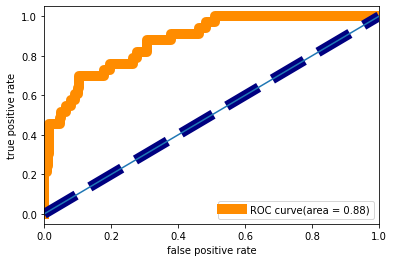

In [682]:
plt.figure()
plt.plot(fpr,tpr,color ="darkorange",lw = 10, label = "ROC curve(area = %0.2f)"%roc_auc)
plt.plot([0,1],[0,1]  , color = "navy" , lw = 10 ,  linestyle = "--" )
plt.xlim ([0.0 ,1.0] )
plt.plot([0.0 , 1.0])
plt.xlabel("false positive rate" )
plt.ylabel("true positive rate" )

plt.legend(loc="lower right")


plt.show()

In [605]:

from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge

In [606]:
parameters = { "alpha" :[0.0001,0.001,0.01,0.1,1,10], "random_state" : list(range(0,10))}

Rn =  Ridge()
cls =   GridSearchCV(ls,parameters)
cls. fit(x_train,y_train)
cls.best_params_

{'alpha': 0.001, 'random_state': 0}

In [608]:
rn = Ridge(alpha = 0.1, random_state = 0)
rn.fit(x_train,y_train)
rn.score(x_train,y_train)
pred_ls =  rn.predict(x_test)
lss = accuracy_score(y_test,pred_ls)
lss

ValueError: Classification metrics can't handle a mix of binary and continuous targets

In [690]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
 
from sklearn import model_selection
from sklearn.utils import class_weight
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd
def run_exps(x_train: pd.DataFrame , y_train: pd.DataFrame, x_test: pd.DataFrame, y_test: pd.DataFrame) -> pd.DataFrame:

    dfs = []
    models = [
          ('LogReg', LogisticRegression()), 
          ('RF', RandomForestClassifier()),
          ('KNN', KNeighborsClassifier()),
          ('SVM', SVC()), 
          ('GNB', GaussianNB()),
        ]
results = []
names = []
scoring = ['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted', 'roc_auc']
target_names = ['malignant', 'benign']
for name, model in models:
        kfold = model_selection.KFold(n_splits=5, shuffle=True, random_state=90210)
        cv_results = model_selection.cross_validate(model, x_train, y_train, cv=kfold, scoring=scoring)
        clf = model.fit(x_train, y_train)
        y_pred = clf.predict(x_test)
        print(name)
        print(classification_report(y_test, y_pred, target_names=target_names))



LR
              precision    recall  f1-score   support

   malignant       0.93      0.98      0.96       261
      benign       0.78      0.42      0.55        33

    accuracy                           0.92       294
   macro avg       0.85      0.70      0.75       294
weighted avg       0.91      0.92      0.91       294

KNN
              precision    recall  f1-score   support

   malignant       0.90      0.99      0.94       261
      benign       0.62      0.15      0.24        33

    accuracy                           0.89       294
   macro avg       0.76      0.57      0.59       294
weighted avg       0.87      0.89      0.86       294

CART
              precision    recall  f1-score   support

   malignant       0.91      0.86      0.89       261
      benign       0.25      0.36      0.30        33

    accuracy                           0.81       294
   macro avg       0.58      0.61      0.59       294
weighted avg       0.84      0.81      0.82       294

NB
    

LR: 0.871447 (0.020398)
KNN: 0.842896 (0.022431)
CART: 0.762585 (0.042353)
NB: 0.862594 (0.025119)
SVM: 0.859884 (0.020893)


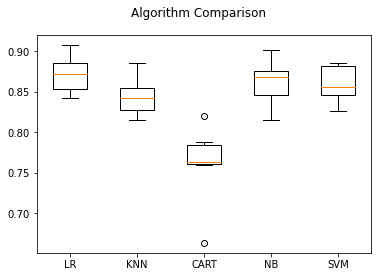

In [743]:

results = []
names = []
scoring = 'accuracy'
for name, model in models:
	kfold = model_selection.KFold(n_splits=8,)
	cv_results = model_selection.cross_val_score(model, x, y, cv=kfold, scoring=scoring)
	results.append(cv_results)
	names.append(name)
	msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
	print(msg)
# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

# Logistic Regression  is the best fit model among other classification models 
 # it has  K fold cross validation score of   0.871447

In [694]:
classifiers = []
model0 = LogisticRegression()
classifiers.append(model0)

model1 = KNeighborsClassifier()
classifiers.append(model1)
model2 = SVC()
classifiers.append(model2)
model3 = DecisionTreeClassifier()
classifiers.append(model3)
model4 = RandomForestClassifier()
classifiers.append(model4)

In [744]:
results = []
names = []
for clf in classifiers:
    clf.fit(x_train, y_train)
    y_pred= clf.predict(x_test)
    acc = accuracy_score(y_test, y_pred)
    print("Accuracy of %s is %s"%(clf, acc))
   
    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix of %s is %s"%(clf, cm))

Accuracy of LogisticRegression() is 0.9217687074829932
Confusion Matrix of LogisticRegression() is [[257   4]
 [ 19  14]]
Accuracy of KNeighborsClassifier() is 0.8945578231292517
Confusion Matrix of KNeighborsClassifier() is [[258   3]
 [ 28   5]]
Accuracy of SVC() is 0.9013605442176871
Confusion Matrix of SVC() is [[259   2]
 [ 27   6]]
Accuracy of DecisionTreeClassifier() is 0.7585034013605442
Confusion Matrix of DecisionTreeClassifier() is [[211  50]
 [ 21  12]]
Accuracy of RandomForestClassifier() is 0.9081632653061225
Confusion Matrix of RandomForestClassifier() is [[259   2]
 [ 25   8]]



# logistics regression  gives the best accuracy score of 0.9217687074829932

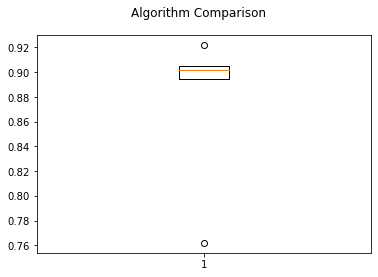

In [703]:
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)

plt.show()

# saving model

In [746]:
import joblib

In [748]:
joblib.dump(model0,"HR Attrition.obj")

['HR Attrition.obj']

In [749]:
ln_from_joblib = joblib.load("HR Attrition.obj")

In [750]:
ln_from_joblib.predict(x_test)

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.